In [1]:
%config InlineBackend.figure_format='retina'
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; } div.cell.selected {border-left-width: 1px !important;}</style>"))

%load_ext autoreload
%autoreload 2
%load_ext rpy2.ipython

import sys
sys.path.append('..')

from src.general import *
from src.eda import *
from src.plotly import *
# from src.probabilities import *
# from src.moments import *

In [2]:
%%R

library(here)
# library(latex2exp)
library(TAF)
library(ggh4x)

here("src", "scripts.R") |> source()

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ lubridate 1.9.3     ✔ tibble    3.2.1
✔ purrr     1.0.2     ✔ tidyr     1.3.0
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter()     masks stats::filter()
✖ dplyr::lag()        masks stats::lag()
✖ lubridate::period() masks TAF::period()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors


here() starts at /Users/johannes/work/eco_restoration
Loading required package: ggplot2
Loading required package: MASS

Attaching package: ‘MASS’

The following object is masked from ‘package:dplyr’:

    select

Loading required package: Matrix

Attaching package: ‘Matrix’

The following objects are masked from ‘package:tidyr’:

    expand, pack, unpack

Loading required package: lme4

arm (Version 1.13-1, built: 2022-8-25)

Working directory is /Users/johannes/work/eco_restoration/notebooks


Attaching package: ‘rstatix’

The following object is masked from ‘package:MASS’:

    select

The following object is masked from ‘package:stats’:

    filter



In [3]:
def drop_species(patches, selected_species):
    
    return patches[selected_species]

def drop_patches(patches, selected_species):
    
    return patches[patches.drop(selected_species, axis=1).sum(axis=1) == 0][selected_species]

OTHER_SPECIES = 'Other_species'
OTHER_SHORTHAND = 'Other_species'

def gather_species(patches, selected_species):
    
    new_patches = patches[selected_species].copy()
    new_patches[OTHER_SPECIES] = (patches.drop(selected_species, axis=1).sum(axis=1) >= 1).astype('int')

    return new_patches

def shorten_species_names(x):
    shortened_strings = []

    for string in x.columns:
        if string == OTHER_SPECIES:
            shortened_strings.append(OTHER_SHORTHAND)

        else:
            try:
                nurse = string.split('_')[-3] + '_'
            except IndexError:
                nurse = ''
            
            Genus = string.split('_')[-2][0] + '._'
                
            species = string.split('_')[-1]#[:2]
            
            shortened_strings.append(nurse + Genus + species)
        
    x.columns = shortened_strings
    return x


def clean_up_species_names(x):
    shortened_strings = []

    for string in x.columns:
        if string == OTHER_SPECIES:
            shortened_strings.append(OTHER_SHORTHAND)

        else:
            try:
                nurse = string.split('_')[-3] + '_'
            except IndexError:
                nurse = ''
            
            Genus = string.split('_')[-2][0] + '._'
                
            species = string.split('_')[-1]#[:2]
            
            shortened_strings.append(nurse + Genus + species)
        
    x.columns = shortened_strings
    return x

In [4]:
config = configure_defaults()
config['min_species'] = 0
config['n_species'] = 8

# Extract data from either location

## Sorbas

In [547]:
p = Path.cwd().parent / 'data' / config['data']
p
# p.parent

PosixPath('/Users/johannes/work/eco_restoration/data/Granada')

In [548]:
config['dataset'] = 'Sorbas'
path = Path.cwd().parent / 'data' / config['datset']
csv = path / 'Corregido.CSV'
df = pd.read_csv(csv, encoding='latin-1', parse_dates={'datetime':['Date','Time']}).set_index('datetime')
df = df.drop(['DeviceId', 'Transecto', 'Diametro mayor', 'Diametro menor', 'Altura'], axis = 1)

print(df[df.iloc[:, 2:-2].sum(axis=1) == 0].shape[0])

print(df.shape)
df

137
(1429, 340)


,Zona,Nodriza,Andryala_ragusina,Anthyllis_cytisoides,Anthyllis_terniflora,Antirrhinum_barrelieri,Artemisia_barrelieri,Artemisia_campestris,Artemisia_herba-alba,Asparagus_acutifolius,...,Thymus_longiflorus.1,Thymus_zygis.1,Trachelium_caeruleum.1,Trigonella_polyceratia.1,Tripodion_tetraphyllum.1,Ulex_parviflorus.1,Urginea_maritima.1,Verbascum_sinuatum.1,Notas,New column
datetime,,,,,,,,,,,,,,,,,,,,,
2024-10-21 14:29:11,Natural,Gypsophila_struthium,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-21 14:34:03,Natural,Gypsophila_struthium,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-21 14:37:50,Natural,Gypsophila_struthium,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-21 14:47:19,Natural,Gypsophila_struthium,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-21 14:57:59,Natural,Gypsophila_struthium,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-24 12:32:57,Natural,Santolina_viscosa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-24 12:33:23,Natural,Santolina_viscosa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-24 12:35:01,Natural,Santolina_viscosa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [549]:
df[df.Zona == 'Restauración'].iloc[:, 2:-2].sum().sum()

2467.0

In [550]:
nurses_list = ['Santolina_viscosa', 'Gypsophila_struthium']


df = df[df['Nodriza'].isin(nurses_list)]
df

,Zona,Nodriza,Andryala_ragusina,Anthyllis_cytisoides,Anthyllis_terniflora,Antirrhinum_barrelieri,Artemisia_barrelieri,Artemisia_campestris,Artemisia_herba-alba,Asparagus_acutifolius,...,Thymus_longiflorus.1,Thymus_zygis.1,Trachelium_caeruleum.1,Trigonella_polyceratia.1,Tripodion_tetraphyllum.1,Ulex_parviflorus.1,Urginea_maritima.1,Verbascum_sinuatum.1,Notas,New column
datetime,,,,,,,,,,,,,,,,,,,,,
2024-10-21 14:29:11,Natural,Gypsophila_struthium,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-21 14:34:03,Natural,Gypsophila_struthium,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-21 14:37:50,Natural,Gypsophila_struthium,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-21 14:47:19,Natural,Gypsophila_struthium,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-21 14:57:59,Natural,Gypsophila_struthium,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-24 12:32:57,Natural,Santolina_viscosa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-24 12:33:23,Natural,Santolina_viscosa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-24 12:35:01,Natural,Santolina_viscosa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [551]:
open_species = df.columns[df.columns.str.endswith('.1')].to_list()
df_patches = df.drop(["Notas", "New column"] + open_species, axis=1)

df_gaps = df.loc[ :, ['Zona', 'Nodriza'] + open_species]
df_gaps.columns = df_gaps.columns.str.replace('.1', '')
df_gaps['Nodriza'] = 'open'

assert (0, 0) == (len(set(df_patches.columns).difference(set(df_gaps.columns))), len(set(df_gaps.columns).difference(set(df_patches.columns))))

df = pd.concat([df_patches, df_gaps], axis=0)
df

df = df.loc[:, df.sum() != 0]
df

/var/folders/qj/3x20pvt510gcfw4686sgnryw0000gn/T/ipykernel_87586/3988685812.py:5: FutureWarning:

The default value of regex will change from True to False in a future version.



,Zona,Nodriza,Andryala_ragusina,Anthyllis_cytisoides,Anthyllis_terniflora,Asparagus_albus,Asparagus_horridus,Asphodelus_cerasiferus,Brachypodium_retusum,Colutea_hispanica,...,Rosmarinus_officinalis,Santolina_viscosa,Sedum_album,Sedum_gypsicola,Sedum_sediforme,Stipa_tenacissima,Teucrium_pseudochamaepitys,Teucrium_turredanum,Thymelaea_hirsuta,Thymus_hyemalis
datetime,,,,,,,,,,,,,,,,,,,,,
2024-10-21 14:29:11,Natural,Gypsophila_struthium,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,2.0,NaN,3.0,NaN,1.0
2024-10-21 14:34:03,Natural,Gypsophila_struthium,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-21 14:37:50,Natural,Gypsophila_struthium,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1.0,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0
2024-10-21 14:47:19,Natural,Gypsophila_struthium,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,3.0,NaN,NaN,1.0,1.0,NaN,6.0,NaN,NaN
2024-10-21 14:57:59,Natural,Gypsophila_struthium,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,5.0,NaN,NaN,1.0,3.0,NaN,2.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-24 12:32:57,Natural,open,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-24 12:33:23,Natural,open,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-24 12:35:01,Natural,open,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [552]:
df[['Nodriza', 'Zona']].value_counts()

Nodriza               Zona        
open                  Natural         998
Santolina_viscosa     Natural         594
open                  Restauración    431
Gypsophila_struthium  Natural         404
                      Restauración    265
Santolina_viscosa     Restauración    166
dtype: int64

In [553]:
(df.set_index(['Nodriza', 'Zona']) > 0).sum(axis=1).reset_index().groupby(['Nodriza', 'Zona']).mean()

0
Nodriza              Zona                  
Gypsophila_struthium Natural       3.089109
                     Restauración  2.067925
Santolina_viscosa    Natural       1.496633
                     Restauración  2.192771
open                 Natural       1.268537
                     Restauración  0.522042

In [554]:
data = pd.concat([pd.get_dummies(df['Nodriza'], prefix = 'Nurse'), df], axis = 1)

data = data.drop('Nodriza', axis = 1)
data = data.drop('Nurse_open', axis=1)
display(data)

,Nurse_Gypsophila_struthium,Nurse_Santolina_viscosa,Zona,Andryala_ragusina,Anthyllis_cytisoides,Anthyllis_terniflora,Asparagus_albus,Asparagus_horridus,Asphodelus_cerasiferus,Brachypodium_retusum,...,Rosmarinus_officinalis,Santolina_viscosa,Sedum_album,Sedum_gypsicola,Sedum_sediforme,Stipa_tenacissima,Teucrium_pseudochamaepitys,Teucrium_turredanum,Thymelaea_hirsuta,Thymus_hyemalis
datetime,,,,,,,,,,,,,,,,,,,,,
2024-10-21 14:29:11,1,0,Natural,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,2.0,NaN,3.0,NaN,1.0
2024-10-21 14:34:03,1,0,Natural,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-21 14:37:50,1,0,Natural,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1.0,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0
2024-10-21 14:47:19,1,0,Natural,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,3.0,NaN,NaN,1.0,1.0,NaN,6.0,NaN,NaN
2024-10-21 14:57:59,1,0,Natural,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,5.0,NaN,NaN,1.0,3.0,NaN,2.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-24 12:32:57,0,0,Natural,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-24 12:33:23,0,0,Natural,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-24 12:35:01,0,0,Natural,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [555]:
x = data[data['Zona'] == 'Natural'].drop('Zona', axis=1) > 0
x

y = data[data['Zona'] != 'Natural'].drop('Zona', axis=1) > 0
y

print(x.shape, y.shape)

nat = x.copy()
rest = y.copy()

(1996, 52) (862, 52)


In [556]:
def get_species(data):
    presences = (data[data.columns[~data.columns.str.startswith('Nurse_')]].sum() > 0).to_frame(name='present')
    return set(presences[presences['present'] == True].index.tolist())

nat_species = get_species(nat)
rest_species = get_species(rest)
common_species = nat_species.intersection(rest_species)
len(nat_species), len(rest_species), len(common_species)

(43, 32, 25)

In [557]:
x = data.copy()
x = x.drop('Zona', axis=1) > 0
print(x.shape)

recruits_species = x.columns[~x.columns.isin(nurses_list)]
recruits_sorted = x.loc[:, ~x.columns.isin(nurses_list)].mean().sort_values(ascending = False).index.tolist()
recruits_sorted

(2858, 52)


['Helianthemum_squamatum',
 'Teucrium_turredanum',
 'Nurse_Santolina_viscosa',
 'Nurse_Gypsophila_struthium',
 'Coris_hispanica',
 'Sedum_sediforme',
 'Helianthemum_syriacum',
 'Stipa_tenacissima',
 'Helianthemum_alypoides',
 'Launaea_fragilis',
 'Thymus_hyemalis',
 'Helichrysum_stoechas',
 'Fumana_hispidula',
 'Anthyllis_terniflora',
 'Thymelaea_hirsuta',
 'Asparagus_horridus',
 'Anthyllis_cytisoides',
 'Polygala_rupestris',
 'Dittrichia_viscosa',
 'Fumana_ericoides',
 'Ononis_tridentata',
 'Asphodelus_cerasiferus',
 'Coronilla_juncea',
 'Rosmarinus_officinalis',
 'Ephedra_fragilis',
 'Launaea_lanifera',
 'Otra',
 'Diplotaxis_harra',
 'Plantago_albicans',
 'Retama_sphaerocarpa',
 'Rhamnus_lycioides',
 'Launaea_arborescens',
 'Colutea_hispanica',
 'Coris_monspeliensis',
 'Teucrium_pseudochamaepitys',
 'Phagnalon_saxatile',
 'Andryala_ragusina',
 'Genista_spartioides',
 'Sedum_gypsicola',
 'Sedum_album',
 'Coronilla_minima',
 'Rosmarinus_eriocalyx',
 'Reseda_phyteuma',
 'Fumana_thymifol

In [558]:
config['n_species'] = 8

if len(nurses_list) > 1:
    n_selected_recruits = config['n_species'] - len(nurses_list)
    selected_species = nurses_list + recruits_sorted[: n_selected_recruits]

if len(nurses_list) == 1:
    n_selected_recruits = config['n_species']
    selected_species = recruits_sorted[: n_selected_recruits]
    
selected_species

['Santolina_viscosa',
 'Gypsophila_struthium',
 'Helianthemum_squamatum',
 'Teucrium_turredanum',
 'Nurse_Santolina_viscosa',
 'Nurse_Gypsophila_struthium',
 'Coris_hispanica',
 'Sedum_sediforme']

In [559]:
(data.groupby(['Zona']).sum() > 0).sum(axis=1)

Zona
Natural         45
Restauración    34
dtype: int64

In [560]:
data.groupby(['Zona'] + nurses_list).sum().sum(axis=1)

Zona          Santolina_viscosa  Gypsophila_struthium
Natural       1.0                1.0                     42.0
                                 2.0                      6.0
              2.0                1.0                     11.0
              3.0                1.0                      4.0
Restauración  1.0                1.0                     34.0
                                 2.0                     58.0
                                 3.0                     12.0
                                 6.0                     10.0
              2.0                1.0                     24.0
                                 3.0                      1.0
              3.0                1.0                      1.0
                                 7.0                      1.0
              4.0                2.0                     11.0
              5.0                1.0                     10.0
                                 10.0                    10.0
              6.

In [561]:
2729+1378+2960

7067

In [562]:
373+969+1125

2467

In [563]:
x = data[data['Zona'] == 'Natural'].drop('Zona', axis=1) > 0
x

y = data[data['Zona'] != 'Natural'].drop('Zona', axis=1) > 0
y

print(x.shape, y.shape)

nat = x.copy()
rest = y.copy()

(1996, 52) (862, 52)


In [564]:
nurses_list = x.columns[x.columns.str.startswith('nurse_')].tolist()
print(nurses_list)
recruits_species = x.columns[~x.columns.isin(nurses_list)]
recruits_sorted = x.loc[:, ~x.columns.isin(nurses_list)].mean().sort_values(ascending = False).index.tolist()
recruits_sorted

n_selected_recruits = config['n_species'] - len(nurses_list)
species_selected = nurses_list + recruits_sorted[: n_selected_recruits]
species_selected

[]


['Helianthemum_squamatum',
 'Teucrium_turredanum',
 'Nurse_Santolina_viscosa',
 'Santolina_viscosa',
 'Nurse_Gypsophila_struthium',
 'Coris_hispanica',
 'Helianthemum_syriacum',
 'Stipa_tenacissima']

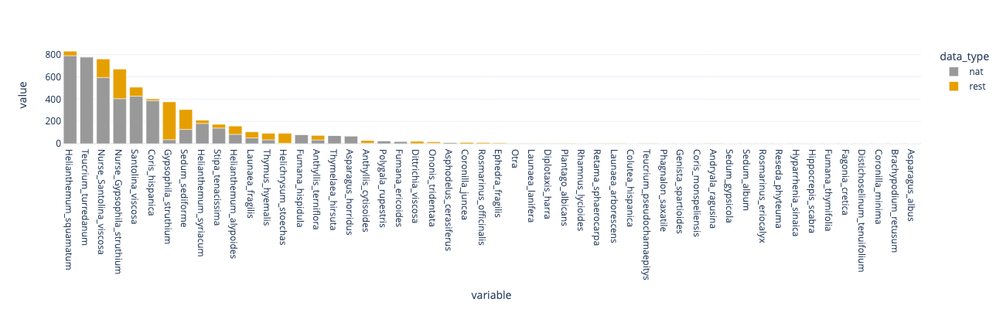

In [565]:
nat_tagged = nat.copy()
nat_tagged.insert(0, 'data_type', 'nat')
rest_tagged = rest.copy()
rest_tagged.insert(0, 'data_type', 'rest')
combined = pd.concat([nat_tagged, rest_tagged], axis = 0, ignore_index = True).fillna(0)
melted = combined.groupby('data_type').sum().reset_index().melt(id_vars = 'data_type')

melted['data_type'] = pd.Categorical(melted['data_type'], ['nat', 'rest'])
melted = melted.sort_values(['variable', 'data_type'])
melted.plot.bar(x='variable', y='value', color='data_type').update_xaxes(categoryorder='total descending').show()#, barmode='group')

species_combined = combined.drop('data_type', axis=1).sum().sort_values(ascending=False).index.tolist()

In [566]:
config['n_species'] = 8
species_selected = [
 'Nurse_Santolina_viscosa',
 'Nurse_Gypsophila_struthium',
 'Helianthemum_squamatum',
 # 'Teucrium_turredanum',
 'Santolina_viscosa',
 'Coris_hispanica',
 'Gypsophila_struthium',
 'Sedum_sediforme',
 'Helianthemum_syriacum',
 # 'Stipa_tenacissima'
]
len(species_selected)
species_selected = species_selected[:config['n_species']]
species_selected

['Nurse_Santolina_viscosa',
 'Nurse_Gypsophila_struthium',
 'Helianthemum_squamatum',
 'Santolina_viscosa',
 'Coris_hispanica',
 'Gypsophila_struthium',
 'Sedum_sediforme',
 'Helianthemum_syriacum']

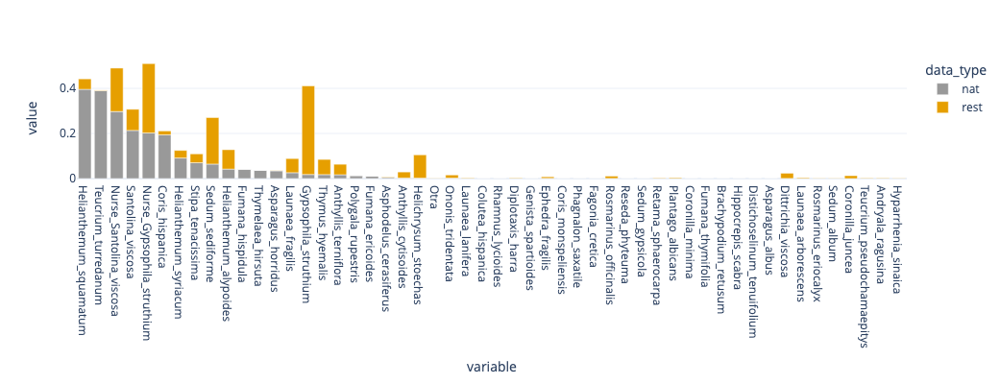

In [567]:
species_by_nat = nat.mean().sort_values(ascending=False).index.tolist()
nat_tagged = nat.copy()
nat_tagged.insert(0, 'data_type', 'nat')
rest_tagged = rest.copy()
rest_tagged.insert(0, 'data_type', 'rest')
combined = pd.concat([nat_tagged, rest_tagged], axis = 0, ignore_index = True).fillna(0)
melted = combined.groupby('data_type').mean().reset_index().melt(id_vars = 'data_type')
melted['variable'] = pd.Categorical(melted['variable'], species_by_nat)
melted['data_type'] = pd.Categorical(melted['data_type'], ['nat', 'rest'])
melted = melted.sort_values(['variable', 'data_type'])
melted.plot.bar(x='variable', y='value', color='data_type')#, barmode='group')

In [568]:
comb = combined.groupby('data_type').sum().T.sort_values(by='nat', ascending=False)
comb = comb[comb.sum(axis=1) >= 10]
comb.index = comb.index.str.replace('_', ' ')
comb

data_type,nat,rest
Helianthemum squamatum,790,40
Teucrium turredanum,778,2
Nurse Santolina viscosa,594,166
Santolina viscosa,426,81
Nurse Gypsophila struthium,404,265
Coris hispanica,387,15
Helianthemum syriacum,182,29
Stipa tenacissima,140,34
Sedum sediforme,128,178
Helianthemum alypoides,84,74


In [569]:
config['other_species_handling'] = 'gather_species'

nat_conf = gather_species(nat, species_selected).pipe(remove_boring, config['min_species'])#.pipe(sort_species)

if OTHER_SPECIES in nat_conf.columns:
    species_selected = nat_conf.drop(OTHER_SPECIES, axis=1).mean().index.tolist()
else:
    species_selected = nat_conf.mean().index.tolist()
    
nat_conf = gather_species(nat, species_selected).pipe(remove_boring, config['min_species'])
nat_conf

,Nurse_Santolina_viscosa,Nurse_Gypsophila_struthium,Helianthemum_squamatum,Santolina_viscosa,Coris_hispanica,Gypsophila_struthium,Sedum_sediforme,Helianthemum_syriacum,Other_species
0,False,True,True,False,True,False,False,False,1
1,False,True,True,True,True,False,False,False,1
2,False,True,True,True,True,False,False,False,1
3,False,True,True,True,True,False,True,True,1
4,False,True,False,True,True,False,True,True,1
...,...,...,...,...,...,...,...,...,...
1991,False,False,False,False,False,False,False,False,0
1992,False,False,False,False,False,False,False,False,0
1993,False,False,False,False,False,False,False,False,0
1994,False,False,False,False,False,False,False,False,0


In [570]:
rest_conf = gather_species(rest, species_selected).pipe(remove_boring, config['min_species'])
# rest_conf = rest_conf[nat_conf.columns]
rest_conf

,Nurse_Santolina_viscosa,Nurse_Gypsophila_struthium,Helianthemum_squamatum,Santolina_viscosa,Coris_hispanica,Gypsophila_struthium,Sedum_sediforme,Helianthemum_syriacum,Other_species
0,False,True,False,False,False,True,False,False,0
1,False,True,False,False,False,True,True,False,1
2,False,True,False,False,False,True,False,False,0
3,False,True,False,False,False,True,True,False,0
4,False,True,True,False,False,True,False,False,1
...,...,...,...,...,...,...,...,...,...
857,False,False,False,False,False,False,False,False,0
858,False,False,False,False,False,False,False,False,0
859,False,False,False,False,False,True,False,False,0
860,False,False,False,True,False,False,False,False,0


(1996, 9) (862, 9)


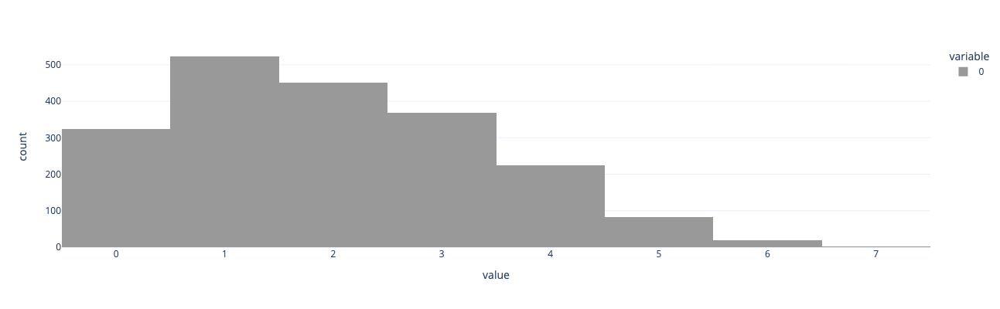

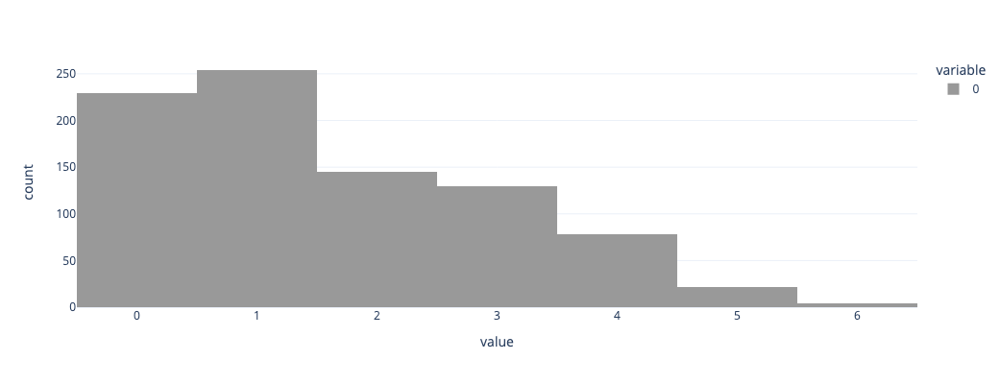

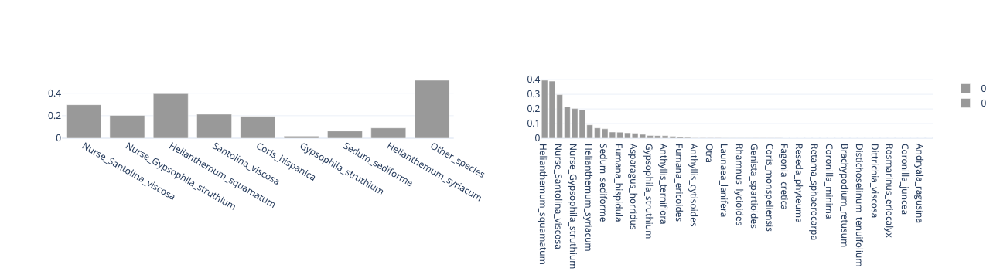

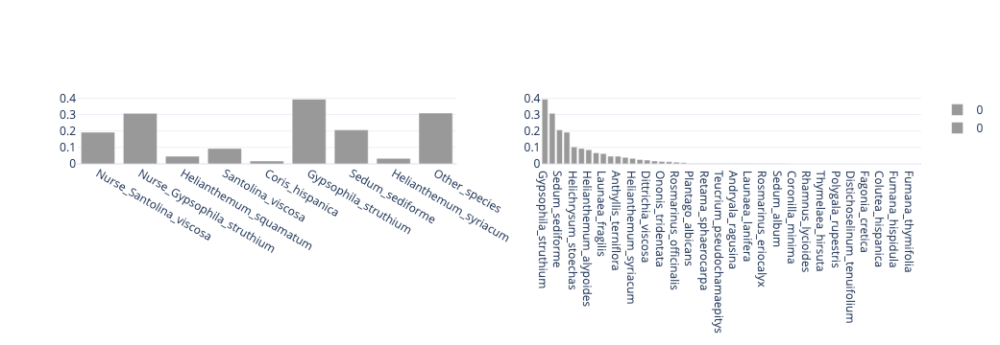

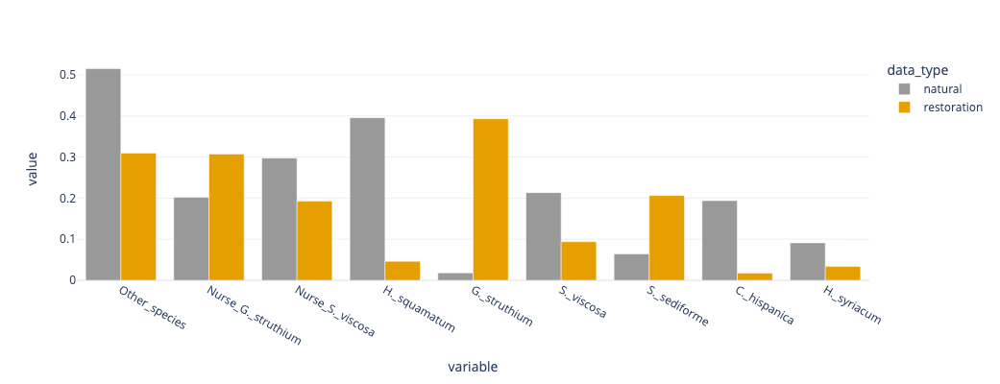

Index(['Nurse_S._viscosa', 'Nurse_G._struthium', 'H._squamatum', 'S._viscosa',
       'C._hispanica', 'G._struthium', 'S._sediforme', 'H._syriacum',
       'Other_species'],
      dtype='object')

In [571]:
#.pipe(sort_species)
    

print(nat_conf.shape, rest_conf.shape)

nat_conf.sum(axis=1).plot.hist().show()
rest_conf.sum(axis=1).plot.hist().show()

lineup_plots([nat_conf.mean().plot.bar(), nat.mean().sort_values(ascending=False).plot.bar()])
lineup_plots([rest_conf.mean().plot.bar(), rest.mean().sort_values(ascending=False).plot.bar()])

nat_tagged = nat_conf.copy().pipe(clean_up_species_names)
species_final = nat_tagged.columns




nat_tagged.insert(0, 'data_type', 'natural')
rest_tagged = rest_conf.copy().pipe(clean_up_species_names)
rest_tagged.insert(0, 'data_type', 'restoration')

# x.iloc[:, 1:] = x.iloc[:, 1:].pipe(clean_up_species_names)

x = pd.concat([nat_tagged, rest_tagged], axis = 0, ignore_index = True).fillna(0)
# x
means = x.groupby('data_type').mean().reset_index().melt(id_vars = 'data_type')
means.plot.bar(x='variable', y='value', color='data_type', barmode = 'group').update_xaxes(categoryorder = 'total descending').show()
species_final

## Escuzar

In [521]:
config['dataset'] = 'Escuzar'
path = Path.cwd().parent / 'data' / config['dataset']
csvs = [p for p in path.glob('*.csv')]
csvs

[PosixPath('/Users/johannes/work/eco_restoration/data/Granada/restoration.csv'),
 PosixPath('/Users/johannes/work/eco_restoration/data/Granada/natural.csv')]

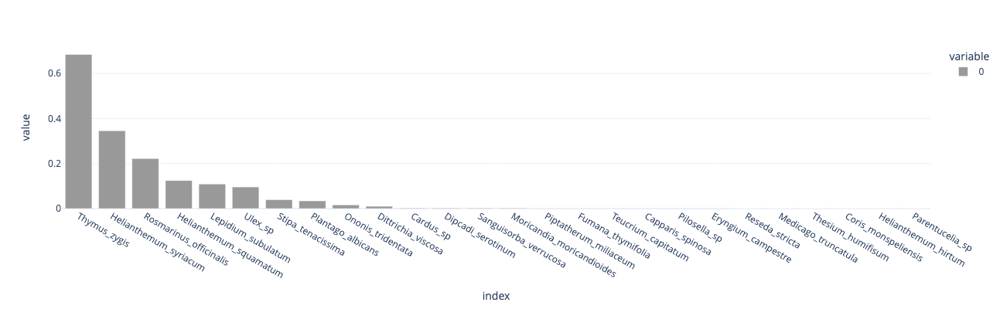

In [522]:
df = pd.read_csv(path / 'restoration.csv')
df.patch.nunique() == df.shape[0]
df = df.set_index(['Date', 'Time', 'D1', 'D2', 'h', 'patch', 'Zone'])
df = df.rename(columns={"Ulex_sp.": "Ulex_sp"})
rest = df.pipe(binarize).astype(int).pipe(sort_species).pipe(remove_boring, config['min_species']).pipe(sort_species)
rest_species = rest.columns.tolist()
len(rest_species)
rest.mean().plot.bar(height=height)

In [523]:
df.shape

(2644, 26)

In [524]:
df.sum().sum()

6962

In [525]:
df = pd.read_csv(path / 'natural.csv')
df.patch.nunique() == df.shape[0]
df = df.set_index(['Date', 'Time', 'D1', 'D2', 'h', 'patch', 'Zone'])
nat = df.pipe(binarize).astype(int).pipe(sort_species).pipe(remove_boring, config['min_species']).pipe(sort_species)
nat['Rosmarinus_officinalis'] = 0
nat_species = nat.columns.tolist()

nat.shape, rest.shape

((5345, 29), (2644, 26))

In [526]:
df.shape

(5345, 28)

In [527]:
df.sum().sum()

12778

In [528]:
(nat.sum() > 0).sum()

28

In [529]:
len(nat.columns), len(rest.columns), len((nat.columns).intersection(rest.columns))

(29, 26, 17)

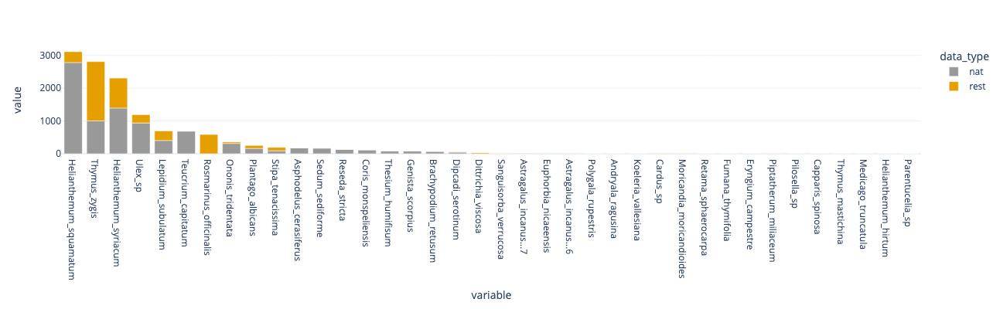

['Helianthemum_squamatum',
 'Thymus_zygis',
 'Helianthemum_syriacum',
 'Ulex_sp',
 'Lepidium_subulatum',
 'Teucrium_capitatum',
 'Rosmarinus_officinalis',
 'Ononis_tridentata',
 'Plantago_albicans',
 'Stipa_tenacissima']

In [530]:
nat_tagged = nat.copy()
nat_tagged.insert(0, 'data_type', 'nat')
rest_tagged = rest.copy()
rest_tagged.insert(0, 'data_type', 'rest')
combined = pd.concat([nat_tagged, rest_tagged], axis = 0, ignore_index = True).fillna(0)
melted = combined.groupby('data_type').sum().reset_index().melt(id_vars = 'data_type')
melted['data_type'] = pd.Categorical(melted['data_type'], ['nat', 'rest'])
melted = melted.sort_values(['variable', 'data_type'])
melted.plot.bar(x='variable', y='value', color='data_type').update_xaxes(categoryorder='total descending').show()#, barmode='group')


# combined = pd.concat([nat, rest], axis = 0, ignore_index = True).fillna(0).mean().sort_values(ascending=False)
# combined.plot.bar().show()
species_combined = combined.drop('data_type', axis=1).sum().sort_values(ascending=False).index.tolist()
species_combined[:10]

(5345, 7) (2644, 7)


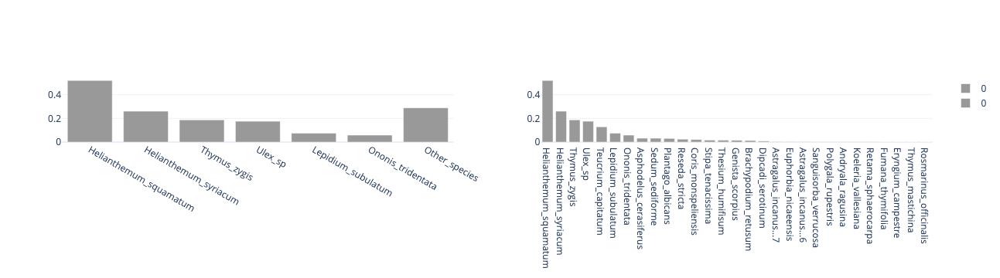

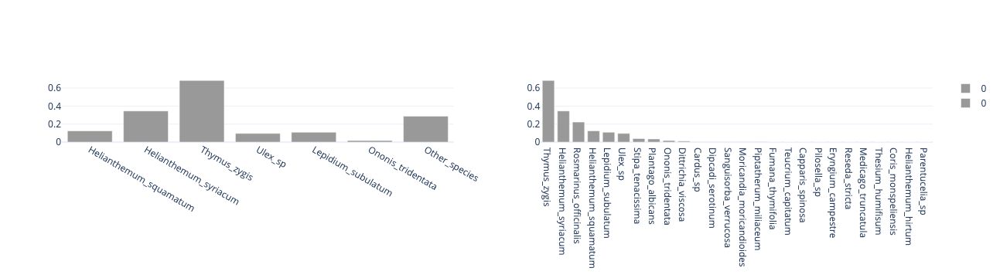

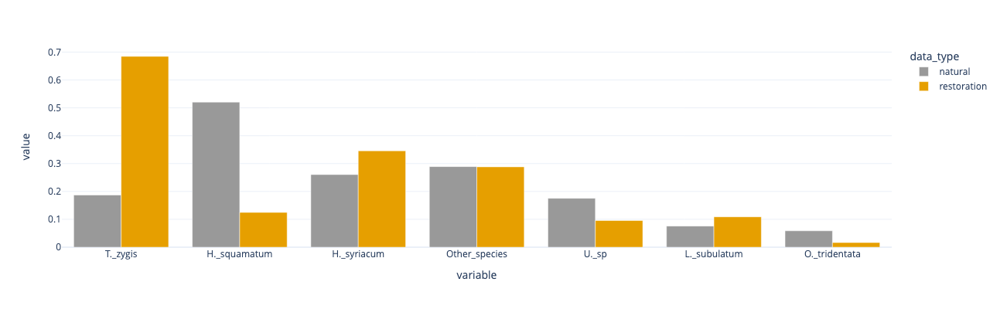

Index(['H._squamatum', 'H._syriacum', 'T._zygis', 'U._sp', 'L._subulatum',
       'O._tridentata', 'Other_species'],
      dtype='object')


In [531]:
config['n_species'] = 6
species_selected = [
 'Helianthemum_squamatum',
 'Thymus_zygis',
 'Helianthemum_syriacum',
 'Ulex_sp',
 'Lepidium_subulatum',
 # 'Teucrium_capitatum',
 # 'Rosmarinus_officinalis',
 'Ononis_tridentata',
 'Plantago_albicans',
 'Stipa_tenacissima'
]
species_selected = species_selected[:config['n_species']]
species_selected

config['other_species_handling'] = 'gather_species'

nat_conf = gather_species(nat, species_selected).pipe(remove_boring, config['min_species'])#.pipe(sort_species)

if OTHER_SPECIES in nat_conf.columns:
    species_selected = nat_conf.drop(OTHER_SPECIES, axis=1).mean().sort_values(ascending = False).index.tolist()
else:
    species_selected = nat_conf.mean().sort_values(ascending = False).index.tolist()
    
nat_conf = gather_species(nat, species_selected).pipe(remove_boring, config['min_species'])#.pipe(sort_species)
    
rest_conf = gather_species(rest, species_selected).pipe(remove_boring, config['min_species'])
rest_conf = rest_conf[nat_conf.columns]

print(nat_conf.shape, rest_conf.shape)

lineup_plots([nat_conf.mean().plot.bar(), nat.mean().sort_values(ascending=False).plot.bar()])
lineup_plots([rest_conf.mean().plot.bar(), rest.mean().sort_values(ascending=False).plot.bar()])

nat_tagged = nat_conf.copy().pipe(clean_up_species_names)
species_final = nat_tagged.columns

nat_tagged.insert(0, 'data_type', 'natural')
rest_tagged = rest_conf.copy().pipe(clean_up_species_names)
rest_tagged.insert(0, 'data_type', 'restoration')
x = pd.concat([nat_tagged, rest_tagged], axis = 0, ignore_index = True).fillna(0)

# x.iloc[:, 1:] = x.iloc[:, 1:].pipe(clean_up_species_names)

means = x.groupby('data_type').mean().reset_index().melt(id_vars = 'data_type')
means.plot.bar(x='variable', y='value', color='data_type', barmode = 'group').update_xaxes(categoryorder = 'total descending').show()
print(species_final)


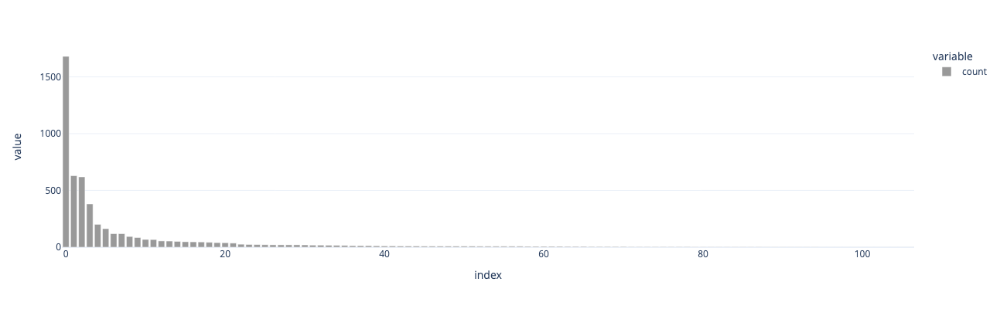

In [532]:
nat_conf.stb.freq(cols=nat_conf.columns.to_list())['count'].plot.bar()

In [545]:
comb = combined.groupby('data_type').sum().T.sort_values(by='nat', ascending=False)
comb = comb[comb.sum(axis=1) >= 10].astype(int)
comb.index = comb.index.str.replace('_', ' ')
comb

data_type,nat,rest
Helianthemum squamatum,2782,330
Helianthemum syriacum,1393,914
Thymus zygis,1001,1810
Ulex sp,938,253
Teucrium capitatum,690,2
Lepidium subulatum,405,288
Ononis tridentata,314,44
Asphodelus cerasiferus,176,0
Sedum sediforme,171,0
Plantago albicans,162,90


# Analyze data for either location

## Pass data to R

In [572]:
test_frac = config['test_split']
other_species_handling = config['other_species_handling']
print(other_species_handling)
location = config['testing_data']
print(location)
n_spp = len(species_selected)
nat_conf = nat_conf.copy().pipe(clean_up_species_names)
rest_conf = rest_conf.copy().pipe(clean_up_species_names)
n_spp

gather_species
Sorbas


8

In [573]:
%%R -i nat_conf,rest_conf,test_frac,n_spp,other_species_handling,location,means,species_final

if (location == 'Escuzar'){
    restoration_type = 'Seed'
    title = 'a)'
    location_name = 'Escúzar'
    chosen_order = 3
}
if (location == 'Sorbas'){
    title = 'b)'
    restoration_type = 'Seedling'
    location_name = 'Sorbas'
    chosen_order = 2
}

train_frac = 1 - test_frac

data_levels = c('restoration', 'natural')
data_labels = c('Restored area', 'Natural area')

min_species_for_fit.labs <- c("Fit with\nempty patches", "Fit without\nempty patches")
names(min_species_for_fit.labs) <- c(0, 1)

order.labs <- c("Fit up to order 2", "Fit up to order 3")
names(order.labs) <- c(2, 3)

levels = nat_conf %>% as_tibble() %>% colnames()
levels

[1] "Nurse_S._viscosa"   "Nurse_G._struthium" "H._squamatum"      
[4] "S._viscosa"         "C._hispanica"       "G._struthium"      
[7] "S._sediforme"       "H._syriacum"        "Other_species"     


In [574]:
%%R
species_condensed = paste(levels, collapse="-")
species_condensed

[1] "Nurse_S._viscosa-Nurse_G._struthium-H._squamatum-S._viscosa-C._hispanica-G._struthium-S._sediforme-H._syriacum-Other_species"


In [575]:
%%R

indicator = ifelse(other_species_handling == 'gather_species', 1, 0)

species_condensed = paste(levels, collapse="-")
frequent_species = levels[- (n_spp + indicator)] #provided "other_species" is at the end

# filename = paste0("outputs/", as.character(n_spp), "+", as.numeric(indicator), "_species/")
# filename = paste0("outputs_petrer_gypsum_with_single_species/", as.character(n_spp), "+", as.numeric(indicator), "_species/")
filename = paste0("outputs_", location, "/",
                  as.character(n_spp), "+", as.numeric(indicator), "_species/",
                 species_condensed, "/")
mkdir(filename)
filename

[1] "outputs_Sorbas/8+1_species/Nurse_S._viscosa-Nurse_G._struthium-H._squamatum-S._viscosa-C._hispanica-G._struthium-S._sediforme-H._syriacum-Other_species/"


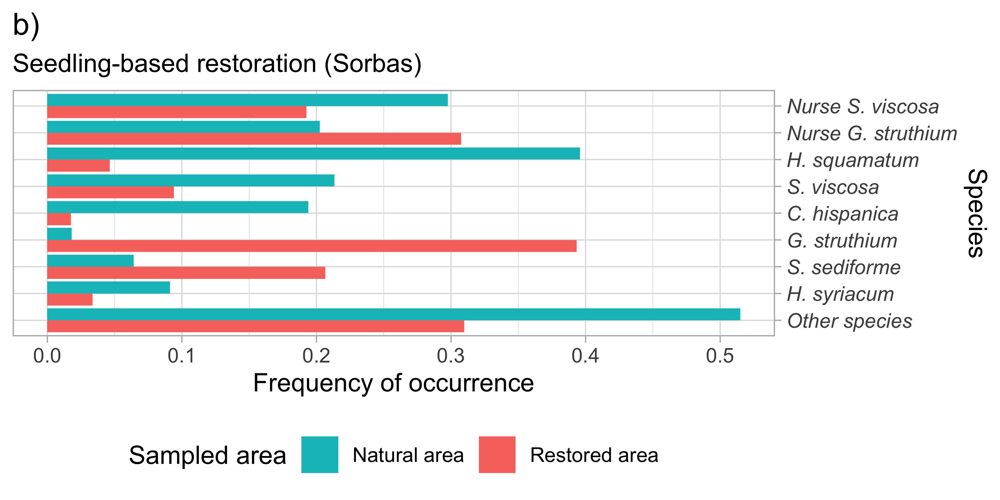

In [576]:
%%R -w 6 -h 3 -r 600 -u in 

p1 = means %>%
    mutate(variable = factor(variable, levels=species_final)) %>%
    mutate(data_type = factor(data_type, levels = data_levels, labels = data_labels)) %>%
    ggplot(aes(x=variable, y=value, fill=data_type)) +
    geom_col(position='dodge') +
    guides(fill = guide_legend(reverse=T)) +
    scale_x_discrete(position = "top", limits=rev, labels=function(x) gsub("U. sp", "U. parviflorus", gsub("_", " ", x, fixed=TRUE), fixed=TRUE)) +
    coord_flip() +
    theme(legend.position='bottom') +
    theme(axis.text.y = element_text(face="italic")) +
    labs(
        title = title,
        subtitle = paste0(restoration_type, '-based restoration (', location_name, ')'),
        # subtitle="Natural area",
         fill = 'Sampled area',
         y = 'Frequency of occurrence',
         x = 'Species'
    )
 
ggsave(paste0(filename, 'fig_frequencies_', location, '_', as.character(n_spp), '+', as.character(indicator), '_species.png'), w=6, h=3)
p1
# species_final

## Goodness-of-fit

In [80]:
%%R
Gstats = tibble()

In [81]:
%%R

Gstats = read_csv(file=paste0(filename, 'Gstats.csv')) %>% as_tibble()
Gstats

Rows: 317 Columns: 15
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (2): data_type, extra_tag
dbl (13): n_unique, x2_counts, pearson, kendall, Gstat_shrink, Gstat_obs, Ch...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
# A tibble: 317 × 15
   n_unique x2_counts pearson kendall Gstat_shrink Gstat_obs Chisq
      <dbl>     <dbl>   <dbl>   <dbl>        <dbl>     <dbl> <dbl>
 1      127      311.   0.856   0.574         333.      367.  560.
 2      108      114.   0.938   0.730         141.      126.  517.
 3      112      114.   0.957   0.709         148.      135.  822.
 4      127      329.   0.841   0.571         351.      385.  559.
 5      111      109.   0.955   0.713         156.      132.  820.
 6      110      150.   0.905   0.699         197.      179.  953.
 7      127      333.   0.847   0.577         336.      373

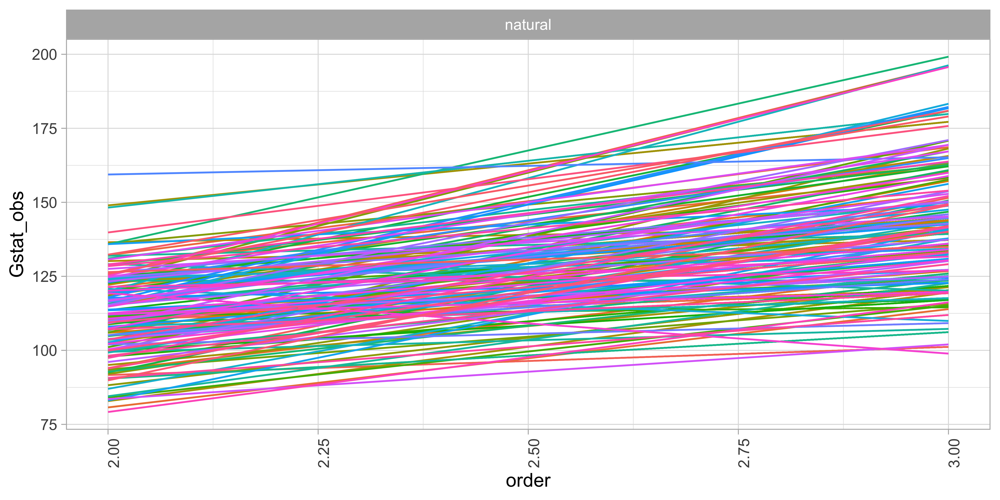

In [82]:
%%R -w 8 -h 4 -u in -r 600
Gstats %>%
    # filter(extra_tag == selected[[1]]) %>%
    filter(frac == -1) %>%
    # filter(frac > .1) %>%
    # filter(frac < .8) %>%
    filter(order %in% c(2, 3)) %>%
    # filter(min_species_for_fit == 1) %>%
    ggplot(aes(x=order, y=Gstat_obs, color = extra_tag, show.legend=F)) +
    facet_grid(. ~ data_type, scales = 'free_y') +#, axes = "all", axis.labels = "all_x") +
    theme(axis.text.x = element_text(angle = 90, hjust = 1),
         legend.position = "none"
         ) +
    # ylim(c(0, NA)) +
    # ylim(c(NA, 300)) +
    # geom_smooth() +
    # geom_point()
    geom_line()
    # geom_point(shape='x')

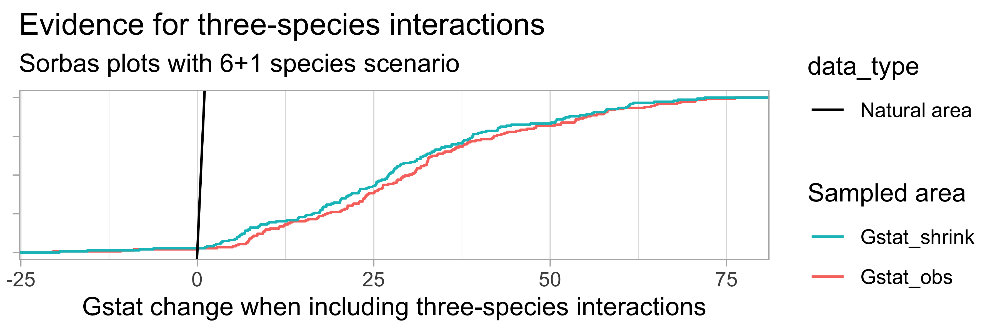

In [83]:
%%R -h 2 -w 6 -u in -r 600

Gstat_change = Gstats %>%
    filter(min_species_for_fit == 1) %>%
    filter(frac == -1) %>%
    mutate(data_type = factor(data_type, levels = c('restoration', 'natural'), labels = c('Restored area', 'Natural area'))) %>%
    # filter(order >= 2) %>%
    mutate(order = factor(order, levels = c(1,2,3),
                          labels = c('first', 'second', 'third'))) %>%
    mutate(frac = factor(frac)) %>%
    pivot_wider(id_cols = c(extra_tag, data_type), names_from = order,
                values_from = c(Gstat_obs, Gstat_shrink)) %>%
    mutate(Gstat_obs = Gstat_obs_third - Gstat_obs_second,
           Gstat_shrink = Gstat_shrink_third - Gstat_shrink_second
          # diff_2_1 = second - first
          ) %>%
    pivot_longer(cols=c('Gstat_obs', 'Gstat_shrink'), names_to = 'shrinkage', values_to='difference')

p = Gstat_change %>%
    ggplot(aes(
        x= difference,
        color = shrinkage,
    linetype=data_type)) +
    guides(colour = guide_legend(reverse=T)) +
    theme(axis.title.y = element_blank(),
         axis.text.y = element_blank(),
        panel.grid.major.y = element_blank(),
        panel.grid.minor.y = element_blank()
         ) +
        # stat_ecdf()
    # geom_rug() +
    # geom_boxplot() +
    stat_ecdf() +
    geom_abline(xintercept = 0) +
    # geom_histogram(bins=20)
    # str()
    labs(title = 'Evidence for three-species interactions',
         subtitle = paste0(location, ' plots with ', as.character(n_spp), '+', as.character(indicator), ' species scenario'),
         color = 'Sampled area',
         x = 'Gstat change when including three-species interactions',
         y = ''
        )

ggsave(paste0(filename, 'fig_likelihood_', location, '_', as.character(n_spp), '+',
              as.character(indicator), '_species.png'), w=6, h=2)

p

In [84]:
%%R

Gstat_change %>%
    filter(data_type == 'Natural area') %>%
    # str()
    group_by(shrinkage) %>%
    summarize(mean = mean(difference, na.rm = TRUE),
              sd = sd(difference, na.rm = TRUE),
              sigmas = mean/sd,
             percentile = mean(difference < 0, na.rm=T)
             )

# A tibble: 2 × 5
  shrinkage     mean    sd sigmas percentile
  <chr>        <dbl> <dbl>  <dbl>      <dbl>
1 Gstat_obs     31.0  18.5   1.67     0.0201
2 Gstat_shrink  28.4  18.5   1.54     0.0268


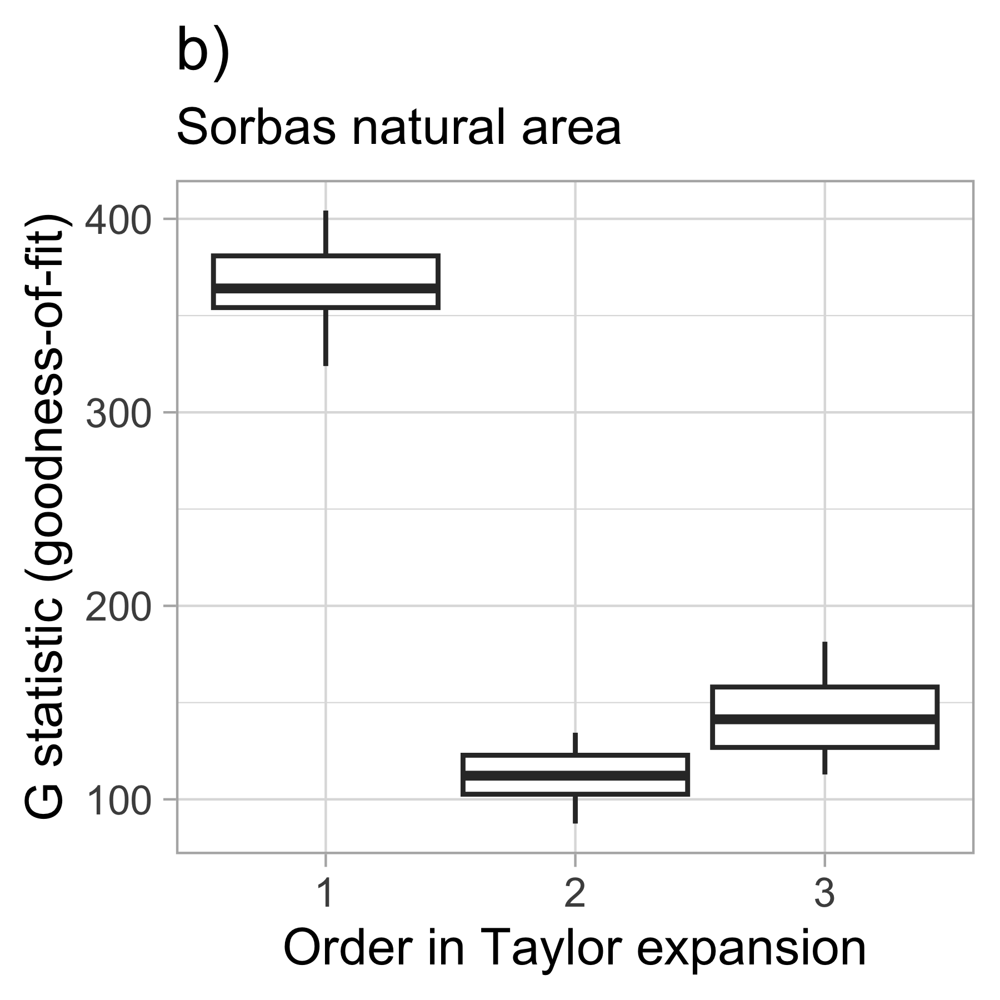

In [85]:
%%R -w 3 -h 3 -u in -r 600
p= Gstats %>%
    filter(order %in% c(1,2, 3)) %>%
    mutate(order = factor(order)) %>%
    mutate(y = Gstat_obs) %>%
    group_by(order) %>%
    summarize(
        ymin = quantile(y,0.05),
        ylower = quantile(y, 0.25),
        ymiddle = median(y),
        yupper = quantile(y, 0.75),
        ymax = quantile(y, 0.95)
          ) %>%
    # str()
    
    ggplot(aes(x=order)) +
    geom_boxplot(aes(ymin = ymin, lower = ylower, middle = ymiddle, upper = yupper, ymax = ymax),
                 stat = "identity"
                ) +
    # filter(min_species_for_fit == 1) %>%
    # ggplot(aes(x=frac, y=Gstat_obs, color = order, group = interaction(order, frac)), show.legend=F) +
    # facet_grid(. ~ data_type, scales = 'free_y') +#, axes = "all", axis.labels = "all_x") +
    # theme(#axis.text.x = element_text(angle = 90, hjust = 1),
         # legend.position = "none"
         # ) +
    labs(title = title,
         subtitle = paste0(location_name, ' natural area'),
        x = 'Order in Taylor expansion',
         y = 'G statistic (goodness-of-fit)'
        )
ggsave(paste0(filename, 'fig_Gstats_', location, '_', as.character(n_spp), '+', as.character(indicator), '_species.png'), w=3, h=3)


p

In [394]:
%%R
# Gstats %>% write_csv(file=paste0(filename,'Gstats.csv'))

In [86]:
%%R
#if results not already calculated
here("src", "scripts.R") |> source()

train_frac = 0.7
test_frac = 1 - train_frac

print(location)

min_species_for_fits = 1:1
orders = 3:1
counters = 1:100

min_species_for_comp = 1
n_sites_choices = c(1000 * 1000)
# n_sites_choices = c(1 * 1000)
n_gibbs = 200
data_types = c('natural')

fracs = seq(.1, 1, .1)

for (counter in counters){

    for (data_type in data_types){
        print(paste("Data type:", data_type))


        if (data_type == 'natural'){data = nat_conf}
        if (data_type == 'restoration'){data = rest_conf}

        splits = data %>%
            resample_partition( c(train=train_frac, test=test_frac))

        date_time = format(Sys.time(), "%Y-%m-%d %H:%M:%OS03")
        # print(date_time)
        
        for (n_sites in n_sites_choices){
    # for (n_sites in ){

                for (order in orders){
                    print(paste("Order:", order))
                    print(format(Sys.time(), "%Y-%m-%d %H:%M:%OS03"))
                    
                    for (min_species_for_fit in min_species_for_fits){

                        if (min_species_for_fit == 1){
                            frac = -1
                            Gstats = append_errors(splits %>% pluck('train') %>% as.data.frame(),
                                                    splits %>% pluck('test') %>% as.data.frame(),
                                                    Gstats, min_species_for_comp,
                                                    min_species_for_fit, order,
                                                    frac, n_sites, n_gibbs, data_type, extra_tag = date_time) %>%
                                    suppressMessages()
                            
                            Gstats %>% write_csv(file=paste0(filename,'Gstats.csv'))
                        }

                        if (min_species_for_fit == 0){
                            for (frac in fracs){

                                Gstats = append_errors(splits %>% pluck('train') %>% as.data.frame(),
                                                        splits %>% pluck('test') %>% as.data.frame(),
                                                        Gstats, min_species_for_comp,
                                                        min_species_for_fit, order,
                                                        frac, n_sites, n_gibbs, data_type, extra_tag = date_time) %>%
                                        suppressMessages()
                                
                            Gstats %>% write_csv(file=paste0(filename,'Gstats.csv'))    
                            }
                        }
                    }
                }
            }

    }
}

print("DONE")
print(format(Sys.time(), "%Y-%m-%d %H:%M:%OS03"))
    
Gstats %>% str()

[1] "Sorbas"
[1] "Data type: natural"
[1] "Order: 3"
[1] "2025-06-27 12:09:253"
[1] -1

Cannot determine terminal size (system error 25, Inappropriate ioctl for device) @tty.c:31 (clic_tty_size)


RInterpreterError: Failed to parse and evaluate line '#if results not already calculated\nhere("src", "scripts.R") |> source()\n\ntrain_frac = 0.7\ntest_frac = 1 - train_frac\n\nprint(location)\n\nmin_species_for_fits = 1:1\norders = 3:1\ncounters = 1:100\n\nmin_species_for_comp = 1\nn_sites_choices = c(1000 * 1000)\n# n_sites_choices = c(1 * 1000)\nn_gibbs = 200\ndata_types = c(\'natural\')\n\nfracs = seq(.1, 1, .1)\n\nfor (counter in counters){\n\n    for (data_type in data_types){\n        print(paste("Data type:", data_type))\n\n\n        if (data_type == \'natural\'){data = nat_conf}\n        if (data_type == \'restoration\'){data = rest_conf}\n\n        splits = data %>%\n            resample_partition( c(train=train_frac, test=test_frac))\n\n        date_time = format(Sys.time(), "%Y-%m-%d %H:%M:%OS03")\n        # print(date_time)\n        \n        for (n_sites in n_sites_choices){\n    # for (n_sites in ){\n\n                for (order in orders){\n                    print(paste("Order:", order))\n                    print(format(Sys.time(), "%Y-%m-%d %H:%M:%OS03"))\n                    \n                    for (min_species_for_fit in min_species_for_fits){\n\n                        if (min_species_for_fit == 1){\n                            frac = -1\n                            Gstats = append_errors(splits %>% pluck(\'train\') %>% as.data.frame(),\n                                                    splits %>% pluck(\'test\') %>% as.data.frame(),\n                                                    Gstats, min_species_for_comp,\n                                                    min_species_for_fit, order,\n                                                    frac, n_sites, n_gibbs, data_type, extra_tag = date_time) %>%\n                                    suppressMessages()\n                            \n                            Gstats %>% write_csv(file=paste0(filename,\'Gstats.csv\'))\n                        }\n\n                        if (min_species_for_fit == 0){\n                            for (frac in fracs){\n\n                                Gstats = append_errors(splits %>% pluck(\'train\') %>% as.data.frame(),\n                                                        splits %>% pluck(\'test\') %>% as.data.frame(),\n                                                        Gstats, min_species_for_comp,\n                                                        min_species_for_fit, order,\n                                                        frac, n_sites, n_gibbs, data_type, extra_tag = date_time) %>%\n                                        suppressMessages()\n                                \n                            Gstats %>% write_csv(file=paste0(filename,\'Gstats.csv\'))    \n                            }\n                        }\n                    }\n                }\n            }\n\n    }\n}\n\nprint("DONE")\nprint(format(Sys.time(), "%Y-%m-%d %H:%M:%OS03"))\n    \nGstats %>% str()\n'.
R error message: 'Cannot determine terminal size (system error 25, Inappropriate ioctl for device) @tty.c:31 (clic_tty_size)'

## Extract coefficients

In [457]:
%%R
# min_species_for_fits = 0:1 #if we are looking only at recruits under a nurse
min_species_for_fits = 1:1# if we are including nurses

In [458]:
%%R
levels

[1] "Nurse_S._viscosa"   "Nurse_G._struthium" "H._squamatum"      
[4] "S._viscosa"         "C._hispanica"       "G._struthium"      
[7] "S._sediforme"       "H._syriacum"        "Other_species"     


In [459]:
%%R

alphas = read_csv(file=paste0(filename,'alphas.csv'))
betas = read_csv(file=paste0(filename,'betas.csv'))
gammas = read_csv(file=paste0(filename,'gammas.csv'))

Rows: 3600 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (4): Var1, Var2, data_type, tag
dbl (5): Freq, value, min_species_for_fit, order, frac

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 14400 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (4): Var1, Var2, data_type, tag
dbl (5): Freq, value, min_species_for_fit, order, frac

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 33600 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (5): Var1, Var2, Var3, data_type, tag
dbl (4): value, min_species_for_fit, order, frac

ℹ Use `spec()` to retrieve the full column specification for

In [361]:
%%R
# if the results are not already available
alphas = tibble()
betas = tibble()
gammas = tibble()

orders = 2:2
counters = 1:200
data_types = c('natural', 'restoration')
min_species_for_fits = 1:1
symmetrize_betas = TRUE

print(format(Sys.time(), "%Y-%m-%d %H:%M:%OS03"))

for (counter in counters){
    tag = format(Sys.time(), "%Y-%m-%d %H:%M:%OS03")
    print(counter)

    for (data_type in data_types){
#         print(paste("Data type:", data_type))
        
#         if (data_type == 'natural'){
#             data = nat_conf
#         }
        
#         if (data_type == 'restoration'){
#             data = rest_conf
#         }
        
#         data  = data  %>% bootstraps(time=1) %>% pluck('splits') %>% as.data.frame() %>% as_tibble()

        for (order in orders){
            # print(paste("Order:", order))
            for (min_species_for_fit in min_species_for_fits){
                # print(paste("Min species:", min_species_for_fit))
                # if (min_species_for_fit == 1){
                
                if (min_species_for_fit == 1){
                    frac = -1
                    if (data_type == 'natural'){
                        data_conf  = nat_conf
                    }

                    if (data_type == 'restoration'){
                        data_conf  = rest_conf
                    }

                    data = data_conf %>% bootstraps(time=1) %>% pluck('splits') %>% as.data.frame() %>% as_tibble()
                    
                    coefs = append_coefs(data, alphas, betas, gammas, frac, order, min_species_for_fit, symmetrize_betas, data_type, tag = tag)
                    alphas = coefs$alphas
                    betas = coefs$betas
                    gammas = coefs$gammas
                }
                
                if (min_species_for_fit == 0){
                            if (data_type == 'natural'){
                                data_conf  = nat_conf
                                
                                if (order == 2){
                                    if (location == 'Escuzar'){
                                    fracs = seq(0.3, 0.3, 0.1) #Granada
                                    }
                                    if (location == 'Sorbas'){
                                    fracs = seq(0.9, 0.9, 0.1) #Sorbas
                                    }
                                }
                                if (order == 3){
                                    if (location == 'Escuzar'){
                                    fracs = seq(0.2, 0.2, 0.1) #Granada
                                    }
                                    if (location == 'Sorbas'){
                                    fracs = seq(0.7, 0.7, 0.1) #Sorbas
                                    }
                                }
                            }

                            if (data_type == 'restoration'){
                                data_conf  = rest_conf
                                
                                if (order == 2){
                                    if (location == 'Escuzar'){
                                    fracs = seq(0.3, 0.3, 0.1) #Granada
                                      }
                                    if (location == 'Sorbas'){
                                    fracs = seq(1, 1, 0.1)  #Sorbas
                                    }
                                }
                                if (order == 3){
                                    if (location == 'Escuzar'){
                                    fracs = seq(0.6, 0.6, 0.1) #Granada
                                    }
                                    if (location == 'Sorbas'){
                                    fracs = seq(1, 1, 0.1) #Sorbas
                                    }
                                }
                            }
                    for (frac in fracs){
                        data = data_conf %>% bootstraps(time=1) %>% pluck('splits') %>% as.data.frame() %>% as_tibble()

                        # print(paste("Frac:", frac))
                        coefs = append_coefs(data, alphas, betas, gammas, frac, order, min_species_for_fit, symmetrize_betas, data_type, tag = tag)
                        alphas = coefs$alphas
                        betas = coefs$betas
                        gammas = coefs$gammas
                    }
                }


            }
        }
    }
}
print('DONE')

[1] "2025-07-19 17:35:333"
[1] 1
[1] 2
[1] 3
[1] 4
[1] 5
[1] 6
[1] 7
[1] 8
[1] 9
[1] 10
[1] 11
[1] 12
[1] 13
[1] 14
[1] 15
[1] 16
[1] 17
[1] 18
[1] 19
[1] 20
[1] 21
[1] 22
[1] 23
[1] 24
[1] 25
[1] 26
[1] 27
[1] 28
[1] 29
[1] 30
[1] 31
[1] 32
[1] 33
[1] 34
[1] 35
[1] 36
[1] 37
[1] 38
[1] 39
[1] 40
[1] 41
[1] 42
[1] 43
[1] 44
[1] 45
[1] 46
[1] 47
[1] 48
[1] 49
[1] 50
[1] 51
[1] 52
[1] 53
[1] 54
[1] 55
[1] 56
[1] 57
[1] 58
[1] 59
[1] 60
[1] 61
[1] 62
[1] 63
[1] 64
[1] 65
[1] 66
[1] 67
[1] 68
[1] 69
[1] 70
[1] 71
[1] 72
[1] 73
[1] 74
[1] 75
[1] 76
[1] 77
[1] 78
[1] 79
[1] 80
[1] 81
[1] 82
[1] 83
[1] 84
[1] 85
[1] 86
[1] 87
[1] 88
[1] 89
[1] 90
[1] 91
[1] 92
[1] 93
[1] 94
[1] 95
[1] 96
[1] 97
[1] 98
[1] 99
[1] 100
[1] 101
[1] 102
[1] 103
[1] 104
[1] 105
[1] 106
[1] 107
[1] 108
[1] 109
[1] 110
[1] 111
[1] 112
[1] 113
[1] 114
[1] 115
[1] 116
[1] 117
[1] 118
[1] 119
[1] 120
[1] 121
[1] 122
[1] 123
[1] 124
[1] 125
[1] 126
[1] 127
[1] 128
[1] 129
[1] 130
[1] 131
[1] 132
[1] 133
[1] 134
[1] 135
[

In [362]:
%%R
filename
alphas %>%
     write_csv(file=paste0(filename,'alphas.csv'))
betas %>%
     write_csv(file=paste0(filename,'betas.csv'))
gammas %>%
    write_csv(file=paste0(filename,'gammas.csv'))

## Analyze for one specific number of focal species

In [480]:
%%R

n_sigmas = 2
# bottom = (1 - 0.68)/2
# bottom = (1-0.954)/2

top = 0.975

bottom = 1 - top
top

[1] 0.975


In [481]:
%%R

bottom

[1] 0.025


In [482]:
%%R
location

[1] "Sorbas"


In [483]:
%%R
levels

[1] "Nurse_S._viscosa"   "Nurse_G._struthium" "H._squamatum"      
[4] "S._viscosa"         "C._hispanica"       "G._struthium"      
[7] "Other_species"     


In [484]:
%%R

# n_spp = 7

# levels = levels_all[1:n_spp] %>% append("Others")
species_condensed = paste(levels, collapse="-")
frequent_species = levels[- (n_spp + indicator)] #provided "other_species" is at the end

indicator = ifelse(other_species_handling == 'gather_species', 1, 0)
filename = paste0("outputs_", location, "/",
              as.character(n_spp), "+", as.numeric(indicator), "_species/",
             species_condensed, "/")

alphas = read_csv(file=paste0(filename,'alphas.csv')) %>% as_tibble() %>% mutate(order = factor(order)) %>% mutate(min_species_for_fit = factor(min_species_for_fit)) %>%
    mutate(Var1 = factor(Var1, levels = levels),
           Var2 = factor(Var2)
          )

betas = read_csv(file=paste0(filename,'betas.csv')) %>% as_tibble() %>% mutate(order = factor(order)) %>% mutate(min_species_for_fit = factor(min_species_for_fit)) %>%
    mutate(Var1 = factor(Var1, levels = levels),
           Var2 = factor(Var2, levels = levels)
          )

gammas = read_csv(file=paste0(filename,'gammas.csv')) %>% as_tibble() %>% mutate(order = factor(order)) %>% mutate(min_species_for_fit = factor(min_species_for_fit)) %>%
    mutate(Var1 = factor(Var1, levels = levels),
           Var2 = factor(Var2, levels = levels),
           Var3 = factor(Var3, levels = levels)
          )
alphas

Rows: 15456 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (4): Var1, Var2, data_type, tag
dbl (5): Freq, value, min_species_for_fit, order, frac

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 46368 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (4): Var1, Var2, data_type, tag
dbl (5): Freq, value, min_species_for_fit, order, frac

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 77280 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (5): Var1, Var2, Var3, data_type, tag
dbl (4): value, min_species_for_fit, order, frac

ℹ Use `spec()` to retrieve the full column specification fo

In [485]:
%%R

# chosen_min_species_for_fit = 0

stats = tibble()

t1 = alphas %>%
        # mutate(data_type = factor(data_type, levels = data_levels, labels = data_labels)) %>%
        filter(!str_detect(Var1, "^Other")) %>%
        # filter(Var1 %in% frequent_species) %>%
        mutate(order = factor(order)) %>%
        # filter(min_species_for_fit == chosen_min_species_for_fit) %>%
        # filter(order == 3) %>%
        group_by(data_type, order, min_species_for_fit, Var1) %>%
        summarize(bottom = quantile(value, bottom),
                  top = quantile(value, top),
                 median = quantile(value, 0.5),
                 mean = mean(value),
                 var = var(value),
                 sd=sd(value),
                 lower=mean-n_sigmas*sd,
               upper=mean+n_sigmas*sd
                 )

compat_alphas = t1 %>%
    ungroup() %>%
    pivot_wider(id_cols=c(min_species_for_fit, order, Var1),
                names_from=data_type,
                values_from=c(bottom, top)
               ) %>%
    mutate(compatible = 0 > (`bottom_restoration` - `top_natural`) * (`top_restoration` - `bottom_natural`),
          ) %>%
    group_by(min_species_for_fit, order) %>%
    summarize(compatible_alphas=mean(compatible)) %>%
    pivot_longer(cols=compatible_alphas)


chisq_alphas = t1 %>%
    pivot_wider(id_cols=c(min_species_for_fit, order, Var1),
                names_from=data_type,
                values_from=c(mean, var)
               ) %>%
    mutate(chisq_alpha = (`mean_restoration` - `mean_natural`)^2 /
                          (`var_restoration` + `var_natural`)
          ) %>%
    summarize(mean_chisq_alphas = mean(chisq_alpha),
              sum_chisq_alphas = sum(chisq_alpha)
             ) %>%
    pivot_longer(cols=c(mean_chisq_alphas, sum_chisq_alphas))

t2 = betas %>%
    # filter(min_species_for_fit == chosen_min_species_for_fit) %>%
    # filter(!str_detect(Var2, "^nu")) %>%
    filter(!str_detect(Var1, "^Other")) %>%
    # filter(Var1 %in% frequent_species) %>%
    filter(!str_detect(Var2, "^Other")) %>%
    # filter(Var2 %in% frequent_species) %>%
    group_by(data_type, order, min_species_for_fit, Var1, Var2) %>%
    summarize(bottom = quantile(value, bottom),
              top = quantile(value, top),
             median = quantile(value, 0.5),
             mean = mean(value),
             var = var(value),
             sd=sd(value),
             lower=mean-n_sigmas*sd,
           upper=mean+n_sigmas*sd
             ) %>%
    # ungroup()
    group_by(data_type, order, min_species_for_fit)

print(dim(t2))

stats_betas = t2 %>%
    summarize(betas_positive = sum(bottom > 0) / length(bottom),
              betas_negative = sum(top < 0) / length(top),
              betas_vanishing =  sum(bottom * top <= 0) / length(bottom * top)) %>%
    pivot_longer(cols=c(betas_positive, betas_negative, betas_vanishing))

chisq_betas = t2 %>%
    pivot_wider(id_cols=c(min_species_for_fit, order, Var1, Var2),
                names_from=data_type,
                values_from=c(mean, var)
               ) %>%
    mutate(chisq_beta = (`mean_restoration` - `mean_natural`)^2 /
                          (`var_restoration` + `var_natural`)
                             ) %>%
    summarize(mean_chisq_betas = mean(chisq_beta),
              sum_chisq_betas = sum(chisq_beta)
             ) %>%
    pivot_longer(cols=c(mean_chisq_betas, sum_chisq_betas))

compat_betas = t2 %>%
    ungroup() %>%
    pivot_wider(id_cols=c(min_species_for_fit, order, Var1, Var2),
                names_from=data_type,
                values_from=c(bottom, top)
               ) %>%
    mutate(compatible = 0 > (`bottom_restoration` - `top_natural`) * (`top_restoration` - `bottom_natural`),
          ) %>%
    group_by(min_species_for_fit, order) %>%
    summarize(compatible_betas=mean(compatible)) %>%
    # summarize(compatible_betas=sum(compatible)) %>%
    pivot_longer(cols=compatible_betas)

t3 = gammas %>%
    # filter(min_species_for_fit == chosen_min_species_for_fit) %>%
    # filter(!str_detect(Var2, "^nu")) %>%
    # filter(!str_detect(Var3, "^nu")) %>%
    filter(!str_detect(Var1, "^Other")) %>%
    # filter(Var1 %in% frequent_species) %>%
    filter(!str_detect(Var2, "^Other")) %>%
    # filter(Var2 %in% frequent_species) %>%
    filter(!str_detect(Var3, "^Other")) %>%
    # filter(Var3 %in% frequent_species) %>%
    # mutate(data_type = factor(data_type, levels = c('restoration', 'natural'), labels = c('Restored area', 'Natural area'))) %>%
    group_by(data_type, min_species_for_fit, order, Var1, Var2, Var3) %>%
    summarize(bottom = quantile(value, bottom),
              top = quantile(value, top),
             median = quantile(value, 0.5),
             mean = mean(value),
             var = var(value),
             sd=sd(value),
             lower=mean-n_sigmas*sd,
           upper=mean+n_sigmas*sd
             ) %>%
    group_by(data_type, order, min_species_for_fit)

t3_cleaned = t3 %>%
    filter(as.numeric(str_detect(Var1, "^Nu"))
           + as.numeric(str_detect(Var2, "^Nu"))
           + as.numeric(str_detect(Var3, "^Nu"))
           <= 1)

stats_gammas = t3_cleaned %>%
    # filter(str_detect(data_type, "^Natural area")) %>%
    summarize(gammas_positive = sum(bottom > 0) / length(bottom),
              gammas_negative = sum(top < 0) / length(top),
              gammas_vanishing =  sum(bottom * top <= 0) / length(bottom * top)) %>%
    pivot_longer(cols=c(gammas_positive, gammas_negative, gammas_vanishing))    

compat_gammas = t3_cleaned %>%
    ungroup() %>%
    pivot_wider(id_cols=c(min_species_for_fit, order, Var1, Var2, Var3),
                names_from=data_type,
                values_from=c(bottom, top)
               ) %>%
    mutate(compatible = 0 > (`bottom_restoration` - `top_natural`) * (`top_restoration` - `bottom_natural`),
    # mutate(compatible = 0 > (`bottom_Restored area` - `top_Natural area`) * (`top_Restored area` - `bottom_Natural area`),
          ) %>%
    group_by(min_species_for_fit, order) %>%
    summarize(compatible_gammas=mean(compatible)) %>%
    # summarize(compatible_gammas=sum(compatible)) %>%
    pivot_longer(cols=compatible_gammas)

chisq_gammas = t3_cleaned %>%
    pivot_wider(id_cols=c(min_species_for_fit, order, Var1, Var2, Var3),
                names_from=data_type,
                values_from=c(mean, var)
               ) %>%
    mutate(chisq_gamma = (`mean_restoration` - `mean_natural`)^2 /
                          (`var_restoration` + `var_natural`)
                             ) %>%
    summarize(mean_chisq_gammas = mean(chisq_gamma),
              sum_chisq_gammas = sum(chisq_gamma)
             )  %>%
    pivot_longer(cols=c(mean_chisq_gammas, sum_chisq_gammas))

stats = bind_rows(stats_betas) %>%
    bind_rows(stats_gammas) %>%
    bind_rows(compat_alphas) %>%
    bind_rows(compat_betas) %>%
    bind_rows(compat_gammas) %>%
    bind_rows(chisq_betas) %>%
    bind_rows(chisq_alphas) %>%
    bind_rows(chisq_gammas) %>%
    mutate(n_species = n_spp,
          indicator = indicator,
          species = species_condensed) %>%
    bind_rows(stats) %>%
    replace_na(list(data_type = "combined"))

# all_t1 = t1 %>%
#     mutate(n_species = n_spp,
#     indicator = indicator,
#     species = species_condensed) %>%
#     bind_rows(all_t1)

# all_t2 = t2 %>%
#     mutate(n_species = n_spp,
#     indicator = indicator,
#     species = species_condensed) %>%
#     bind_rows(all_t2)

# all_t3 = t3 %>%
#     mutate(n_species = n_spp,
#     indicator = indicator,
#     species = species_condensed) %>%
#     bind_rows(all_t3)

`summarise()` has grouped output by 'data_type', 'order',
'min_species_for_fit'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'min_species_for_fit'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'order'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'data_type', 'order',
'min_species_for_fit', 'Var1'. You can override using the `.groups` argument.
[1] 60 13
`summarise()` has grouped output by 'data_type', 'order'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'order'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'min_species_for_fit'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'data_type', 'min_species_for_fit',
'order', 'Var1', 'Var2'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'data_type', 'order'. You can override
using 

Scale for y is already present.
Adding another scale for y, which will replace the existing scale.


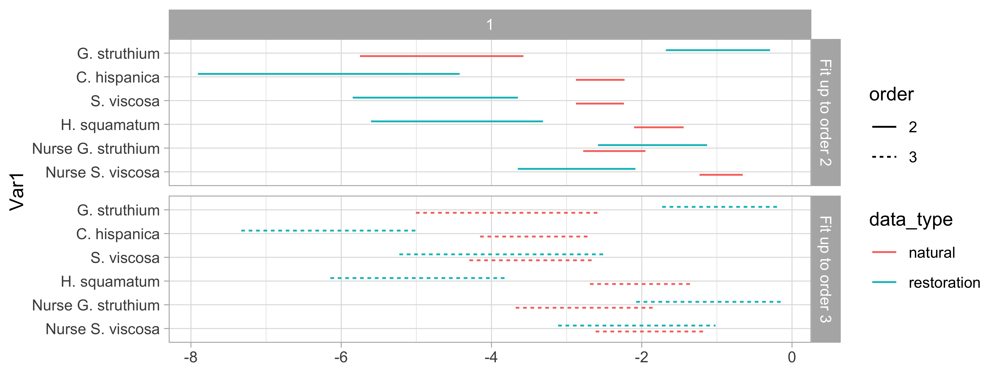

In [486]:
%%R -w 8 -h 3 -r 600 -u in    
    
p1 = t1 %>%
    mutate() %>%
    ggplot(aes(y=Var1,
               color=data_type,
              linetype = order)
          ) +
    facet_grid(order ~ min_species_for_fit, labeller = labeller(order = order.labs)) +
    scale_y_discrete(limits=rev) +
    # scale_color_viridis(option='viridis', end=.9, direction=-1) +
    # facet_grid(min_species_for_fit ~ Var1) +
    # facet_wrap(Var1 ~., scales = 'free_y') +#, independent = 'y') +
    # geom_vline(xintercept = 0) +   
    # geom_boxplot()#width=.1, alpha=.1)
    # geom_point(aes(x=median), position = position_dodge2(width = 0.5)) +
    # geom_errorbar(aes(xmin=lower, xmax=upper), linetype='dashed') +
    geom_linerange(aes(xmin = bottom, xmax=top), position = position_dodge2(width = 0.5)) +
    scale_y_discrete(labels=function(x) gsub("_", " ", x, fixed=TRUE))

p1

In [487]:
%%R

delta = t2 %>%
        filter(order == chosen_order) %>%
        pivot_wider(id_cols=c(min_species_for_fit, order, Var1, Var2),
                    names_from=data_type,
                    values_from=c(bottom, top)
                   ) %>%
        mutate(delta = case_when(bottom_natural > top_restoration ~ '-',
                                 top_natural < bottom_restoration ~ '+',
                                TRUE ~ '='
                                )
              ) %>%
                filter(order == chosen_order)

if (location == 'Escuzar'){
    delta = delta %>%
            filter(!str_detect(Var2, "^Other")) %>%
            mutate(Var1 = factor(Var1, levels=levels)) %>%
            mutate(Var2 = factor(Var2, levels=levels))
}

if (location == 'Sorbas'){
    delta = delta %>%
            filter(!str_detect(Var2, "^Nurse")) %>%
            filter(!str_detect(Var2, "^Other")) %>%
            mutate(Var1 = factor(Var1, levels=levels)) %>%
            mutate(Var2 = factor(Var2, levels=levels)) %>%
            mutate(nurse_involved = case_when(str_detect(Var1, "^Nurse") ~ 'Nurse, Recruit',
                                         TRUE ~ 'Recruit, Recruit'))
}

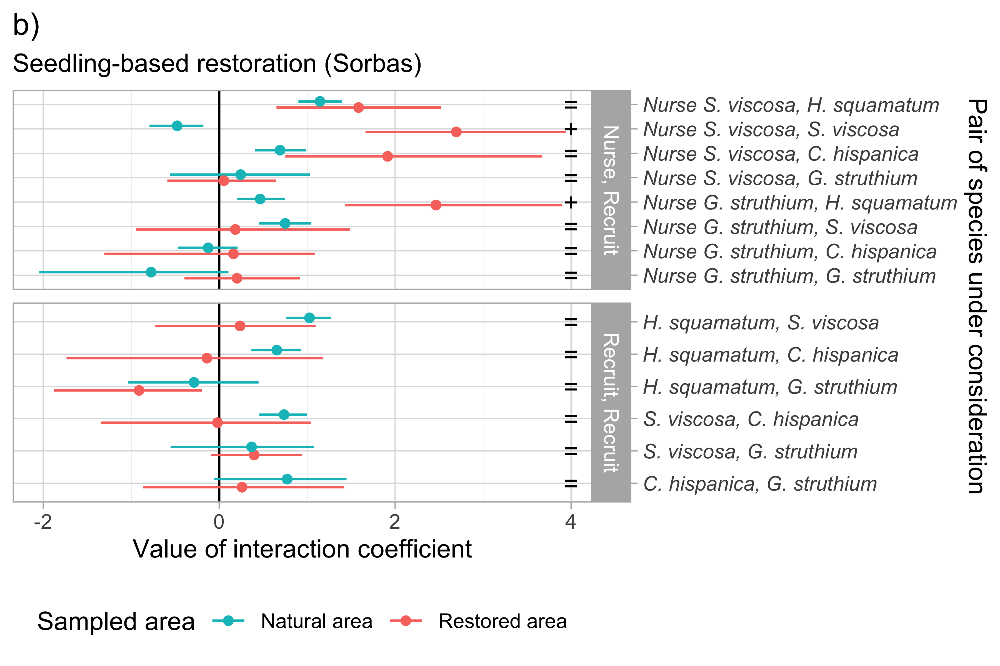

In [488]:
%%R -w 6 -h 4 -r 600 -u in 

if (location == 'Escuzar'){
    p2 = t2 %>%
        filter(order == chosen_order) %>%
        filter(!str_detect(Var2, "^Other")) %>%
        mutate(Var1 = factor(Var1, levels=levels)) %>%
        mutate(Var2 = factor(Var2, levels=levels)) %>%
        mutate(data_type = factor(data_type, levels = c('restoration', 'natural'), labels = c('Restored', 'Natural'))) %>%
        ggplot(aes(y = reorder(interaction(Var1, Var2), desc(interaction(Var2, Var1))),
                   # x = value,
                   color = data_type
                   # linetype = order
                  # color = data_type
                  ))
    
    x_max=3.2
}

if (location == 'Sorbas'){
    p2 = t2 %>%
        filter(order == chosen_order) %>%
        filter(!str_detect(Var2, "^Nurse")) %>%
        filter(!str_detect(Var2, "^Other")) %>%
        mutate(Var1 = factor(Var1, levels=levels)) %>%
        mutate(Var2 = factor(Var2, levels=levels)) %>%
        mutate(data_type = factor(data_type, levels = c('restoration', 'natural'), labels = c('Restored area', 'Natural area'))) %>%
        mutate(nurse_involved = case_when(str_detect(Var1, "^Nurse") ~ 'Nurse, Recruit',
                                         TRUE ~ 'Recruit, Recruit')) %>%
        ggplot(aes(y = reorder(interaction(Var1, Var2), desc(interaction(Var2, Var1))),
                   # x = value,
                   color = data_type#,
                   # linetype = order
                  # color = data_type
                  )) +
        # facet_grid(order ~ min_species_for_fit, labeller = labeller(order = order.labs)) +
        facet_grid2(nurse_involved ~ ., scales = 'free_y')
    
    x_max = 4
}
    
p2 = p2 +
    guides(colour = guide_legend(reverse=T)) +
    geom_vline(xintercept = 0) +
    # geom_linerange(aes(xmin = bottom_two_sigma, xmax=top_two_sigma), position = position_dodge2(width = 0.5), linetype='dashed') +
    # geom_errorbar(aes(xmin=lower, xmax=upper), linetype='dashed') +
    geom_linerange(aes(xmin = bottom, xmax=top), position = position_dodge2(width = 0.5)) +
    geom_point(aes(x=median), position = position_dodge2(width = 0.5)) +
    geom_text(data=delta, aes(label=delta), x=x_max, color='black') +
    # theme(
        # panel.grid.major.y = element_blank(),
        # panel.grid.minor.y = element_blank()
    # ) +
    # scale_y_reverse() +
    theme(legend.position = "bottom",
          axis.text.y = element_text(face="italic")) +

    labs(title = title,
            subtitle = paste0(restoration_type, '-based restoration (',location_name,')'),
         # subtitle = paste0(location, ' plots with ', as.character(n_spp), '+', as.character(indicator), ' species scenario'),
         color = 'Sampled area',
         x = 'Value of interaction coefficient',
         y = 'Pair of species under consideration'
        ) +
    scale_y_discrete(position = "right", labels=function(x) gsub("U. sp", 'U. parviflorus', gsub("_", " ", gsub(", _", ". ", gsub(".", ", ", x, fixed=TRUE), fixed=TRUE), fixed=TRUE), fixed=TRUE))


ggsave(paste0(filename, 'fig_quadratics_', location, '_', as.character(n_spp), '+', as.character(indicator), '_species.png'), w=6, h=4)

p2

In [489]:
%%R
chosen_order

[1] 2


`summarise()` has grouped output by 'order', 'min_species_for_fit',
'sign_natural'. You can override using the `.groups` argument.


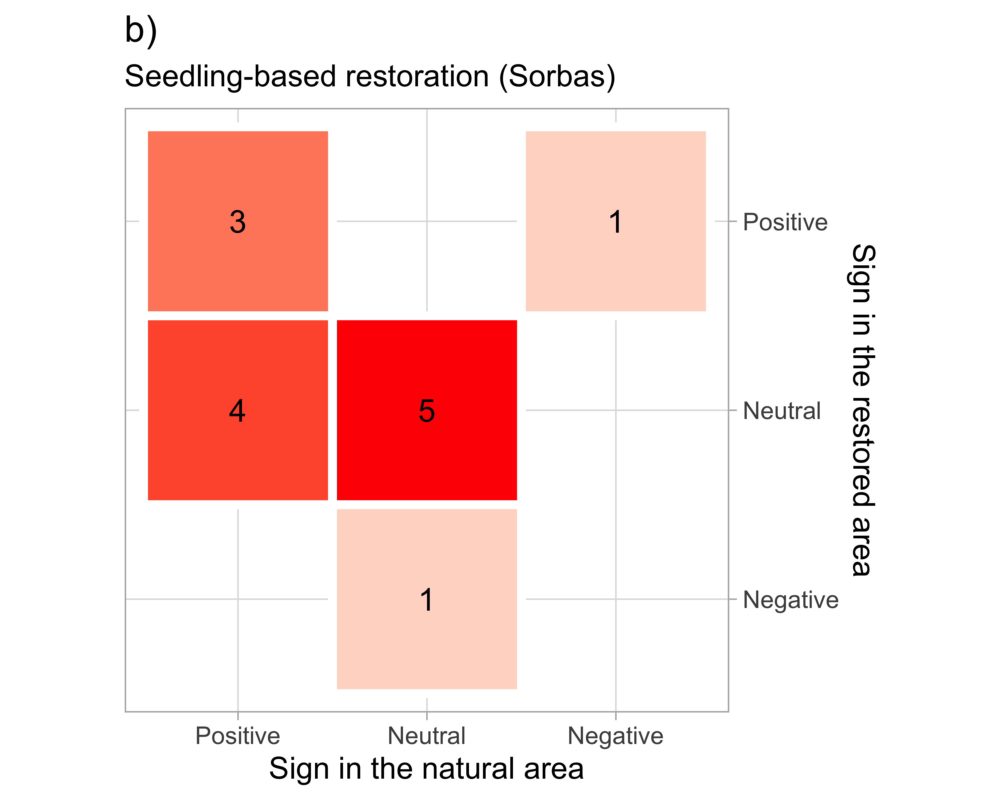

In [490]:
%%R -w 5 -h 4 -u in -r 600

mat = t2 %>%
    filter(order == chosen_order) %>%
    filter(!str_detect(Var2, "^Nurse")) %>%
    pivot_wider(id_cols=c(min_species_for_fit, order, Var1, Var2),
                names_from=data_type,
                values_from=c(bottom, top)
               ) %>%
    mutate(sign_natural = case_when(bottom_natural > 0 ~ 'Positive',
                             top_natural < 0 ~ 'Negative',
                             bottom_natural * top_natural <= 0 ~ 'Neutral',
                            # TRUE ~ value
                            ),
           sign_restoration = case_when(bottom_restoration > 0 ~ 'Positive',
                             top_restoration < 0 ~ 'Negative',
                             bottom_restoration * top_restoration <= 0 ~ 'Neutral'
                                       )
          ) %>%
    mutate(sign_natural = factor(sign_natural, levels = c('Positive', 'Neutral', 'Negative'))) %>%
    mutate(sign_restoration = factor(sign_restoration, levels = c('Negative', 'Neutral', 'Positive'))) %>%
    group_by(order, min_species_for_fit, sign_natural, sign_restoration) %>%
    summarize(count = n())
    
p = mat  %>%
    ggplot(aes(x=sign_natural, y=sign_restoration, label=count, fill=count)) +
       geom_tile(color = "white",
                lwd = 1.5,
                linetype = 1) +
    #     # geom_text(aes(label = value), color = "black", size = 4) +
        scale_fill_gradient2(low = "blue",
                           mid = "white",
                           high = "red") +
    # facet_grid(order ~ min_species_for_fit, labeller = labeller(order = order.labs)) +
    coord_fixed() +
    scale_x_discrete(drop = FALSE) +
    scale_y_discrete(position='right') +
    geom_text(aes(label = count), color = "black", size = 4) +
    guides(fill = "none") +
    labs(title =  title,
        subtitle = paste0(restoration_type, '-based restoration (',location_name,')'),
        y = 'Sign in the restored area',
         x = 'Sign in the natural area'
)
   
ggsave(paste0(filename, 'fig_conf_mat_', location, '_', as.character(n_spp), '+',
              as.character(indicator), '_species.png'), w=5, h=4)

p

In [197]:
%%R
accuracies = mat %>%
    # ungroup() %>%
    group_by(order, min_species_for_fit) %>%
    # filter(order == chosen_order) %>%
    mutate(diag = case_when(sign_natural == sign_restoration ~ count,
                                TRUE ~ 0)
          ) %>%
    summarize(accuracy = sum(diag) / sum(count))
    
accuracies

`summarise()` has grouped output by 'order'. You can override using the
`.groups` argument.
# A tibble: 1 × 3
# Groups:   order [1]
  order min_species_for_fit accuracy
  <fct> <fct>                  <dbl>
1 3     1                      0.467


In [198]:
%%R
compat_and_sign = t2 %>%
    # filter(order == 3) %>%
    pivot_wider(id_cols=c(min_species_for_fit, order, Var1, Var2),
                names_from=data_type,
                values_from=c(bottom, top)
               ) %>%
    mutate(sign_natural = case_when(bottom_natural > 0 ~ 'Positive',
                             top_natural < 0 ~ 'Negative',
                             bottom_natural * top_natural <= 0 ~ 'Neutral',
                            # TRUE ~ value
                            ),
           sign_restoration = case_when(bottom_restoration > 0 ~ 'Positive',
                             top_restoration < 0 ~ 'Negative',
                             bottom_restoration * top_restoration <= 0 ~ 'Neutral'
                                       )
          ) %>%
    mutate(sign_natural = factor(sign_natural, levels = c('Positive', 'Neutral', 'Negative'))) %>%
    mutate(sign_restoration = factor(sign_restoration, levels = c('Negative', 'Neutral', 'Positive'))) %>%
    mutate(compatible = 0 > (`bottom_restoration` - `top_natural`) * (`top_restoration` - `bottom_natural`))

compat_and_sign %>%
    summarize(compatible=mean(compatible))

`summarise()` has grouped output by 'order'. You can override using the
`.groups` argument.
# A tibble: 1 × 3
# Groups:   order [1]
  order min_species_for_fit compatible
  <fct> <fct>                    <dbl>
1 3     1                        0.733


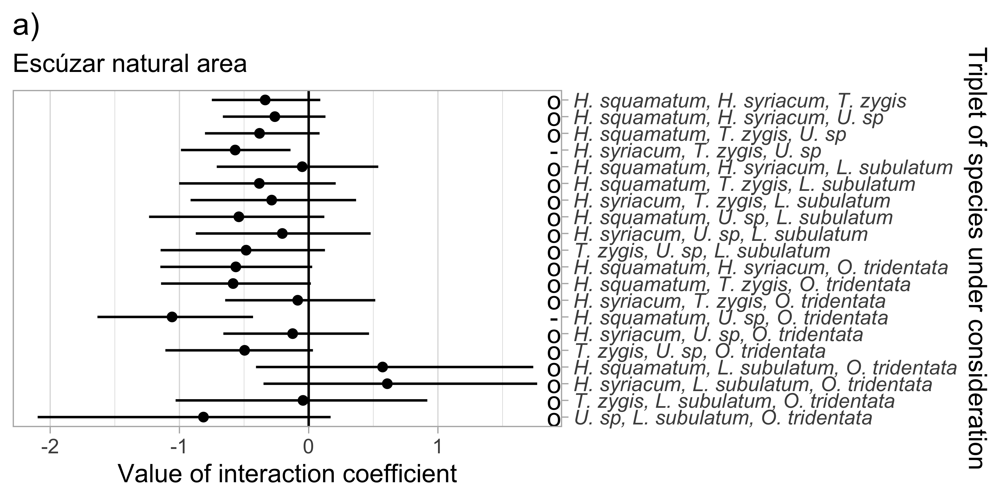

In [206]:
%%R -w 6 -h 3 -r 600 -u in 

if (location == 'Escuzar'){x_max = 1.9}
if (location == 'Sorbas'){x_max = 3.4}
    
p3 = t3_cleaned %>%
    filter(order == 3) %>%
    filter(data_type == 'natural') %>%
    mutate(data_type = factor(data_type, levels = c('restoration', 'natural'), labels = c('Restored', 'Natural'))) %>%
    mutate(sign = case_when(bottom >  0 ~ '+',
                                 top < 0 ~ '-',
                                TRUE ~ 'o')
          ) %>%
    ggplot(aes(y = reorder(interaction(Var1, Var2, Var3), desc(interaction(Var1, Var2, Var3))),
               # x = value,
               # color = n_tot,
              # color = data_type
              )) +

    geom_vline(xintercept = 0) +
    # geom_errorbar(aes(xmin=lower, xmax=upper), linetype='dashed') +
    geom_linerange(aes(xmin = bottom, xmax=top), position = position_dodge2(width = 0.5)) +
    geom_point(aes(x=median), position = position_dodge2(width = 0.5)) +
    geom_text(aes(label=sign), x=x_max, color='black') +

    scale_y_discrete(position = "right", labels=function(x) gsub("_", " ", gsub(", _", ". ", gsub(".", ", ", x, fixed=TRUE), fixed=TRUE), fixed=TRUE)) +
    guides(colour = guide_legend(reverse=T)) +
    # geom_boxplot() +
    theme(
        panel.grid.major.y = element_blank(),
        panel.grid.minor.y = element_blank(),
        legend.position = "bottom",
        axis.text.y = element_text(face="italic"),

    ) +
    labs(title = title,
         subtitle = paste0(location_name, ' natural area'),
         # color = 'Sampled area',
         x = 'Value of interaction coefficient',
         y = 'Triplet of species under consideration'
        )

ggsave(paste0(filename, 'fig_cubics_', location, '_', as.character(n_spp), '+', as.character(indicator), '_species.png'), w=7, h=3)

p3

In [64]:
%%R
t3_cleaned %>%
    filter(order == 3) %>%
    filter(data_type == 'natural') %>%
    select(top) %>%
    mutate(negative = top < 0) %>%
    summarize(count(negative))


Error in select(., top) : unused argument (top)


RInterpreterError: Failed to parse and evaluate line "t3_cleaned %>%\n    # filter(order == 3) %>%\n    filter(data_type == 'natural') %>%\n    select(top) %>%\n    mutate(negative = top < 0) %>%\n    summarize(count(negative))\n".
R error message: 'Error in select(., top) : unused argument (top)'

## Read results from multiple cases with different numbers of species in Granada

In [577]:
%%R

location = 'Sorbas'
levels_all = c("Nurse_S._viscosa",   "Nurse_G._struthium", "H._squamatum", "S._viscosa", "C._hispanica", "G._struthium", "S._sediforme", "H._syriacum", "Other_species") 

In [415]:
%%R

location = 'Escuzar'
levels_all = c("H._squamatum",  "H._syriacum",   "T._zygis" ,     "U._sp",  "L._subulatum",  "O._tridentata", "P._albicans", "S._tenacissima", "Other_species")

In [578]:
%%R
for (n_spp in 5:8){
    levels = levels_all[1:n_spp] %>% append("Other_species")
    # print(levels)
    species_condensed = paste(levels, collapse="-")
    frequent_species = levels[- (n_spp + indicator)] #provided "other_species" is at the end

    indicator = ifelse(other_species_handling == 'gather_species', 1, 0)
    filename = paste0("outputs_", location, "/",
                  as.character(n_spp), "+", as.numeric(indicator), "_species/",
                 species_condensed, "/")
    print(filename)
}

[1] "outputs_Sorbas/5+1_species/Nurse_S._viscosa-Nurse_G._struthium-H._squamatum-S._viscosa-C._hispanica-Other_species/"
[1] "outputs_Sorbas/6+1_species/Nurse_S._viscosa-Nurse_G._struthium-H._squamatum-S._viscosa-C._hispanica-G._struthium-Other_species/"
[1] "outputs_Sorbas/7+1_species/Nurse_S._viscosa-Nurse_G._struthium-H._squamatum-S._viscosa-C._hispanica-G._struthium-S._sediforme-Other_species/"
[1] "outputs_Sorbas/8+1_species/Nurse_S._viscosa-Nurse_G._struthium-H._squamatum-S._viscosa-C._hispanica-G._struthium-S._sediforme-H._syriacum-Other_species/"


In [596]:
%%R

if (location == 'Escuzar'){
    restoration_type = 'Seed'
    title = 'a)'
    restoration_location = 'Escúzar'
    chosen_order = 3
}
if (location == 'Sorbas'){
    title = 'b)'
    restoration_type = 'Seedling'
    restoration_location = 'Sorbas'
    chosen_order = 2
}


if (location == 'Sorbas'){
    chosen_fit_orders = c(2,3)
    chosen_order = 2
}
if (location == 'Escuzar'){
    chosen_fit_order = c(2,3)
    chosen_order = 3
}

stats = tibble()
all_t1 = tibble()
all_t2 = tibble()
all_t3 = tibble()

for (n_spp in 5:8){
    levels = levels_all[1:n_spp] %>% append("Other_species")
    print(levels)
    species_condensed = paste(levels, collapse="-")
    frequent_species = levels[- (n_spp + indicator)] #provided "other_species" is at the end

    indicator = ifelse(other_species_handling == 'gather_species', 1, 0)
    filename = paste0("outputs_", location, "/",
                  as.character(n_spp), "+", as.numeric(indicator), "_species/",
                 species_condensed, "/")

    alphas = read_csv(file=paste0(filename,'alphas.csv')) %>% as_tibble() %>% mutate(order = factor(order)) %>% mutate(min_species_for_fit = factor(min_species_for_fit)) %>%
    mutate(Var1 = factor(Var1, levels = levels),
           Var2 = factor(Var2)
          )

    betas = read_csv(file=paste0(filename,'betas.csv')) %>% as_tibble() %>% mutate(order = factor(order)) %>% mutate(min_species_for_fit = factor(min_species_for_fit)) %>%
        mutate(Var1 = factor(Var1, levels = levels),
               Var2 = factor(Var2, levels = levels)
              )

    gammas = read_csv(file=paste0(filename,'gammas.csv')) %>% as_tibble() %>% mutate(order = factor(order)) %>% mutate(min_species_for_fit = factor(min_species_for_fit)) %>%
        mutate(Var1 = factor(Var1, levels = levels),
               Var2 = factor(Var2, levels = levels),
               Var3 = factor(Var3, levels = levels)
          )

    t1 = alphas %>%
        # mutate(data_type = factor(data_type, levels = data_levels, labels = data_labels)) %>%
        filter(Var1 %in% frequent_species) %>%
        mutate(order = factor(order)) %>%
        filter(min_species_for_fit == 1) %>%
        # filter(order == 3) %>%
        group_by(data_type, order, min_species_for_fit, Var1) %>%
        summarize(bottom = quantile(value, bottom),
                  top = quantile(value, top),
                 median = quantile(value, 0.5),
                 mean = mean(value),
                 var = var(value),
                 sd=sd(value),
                 lower=mean-n_sigmas*sd,
               upper=mean+n_sigmas*sd
                 )
    
    compat_alphas = t1 %>%
        ungroup() %>%
        pivot_wider(id_cols=c(min_species_for_fit, order, Var1),
                    names_from=data_type,
                    values_from=c(bottom, top)
                   ) %>%
        # mutate(compatible = 0 > (`bottom_Restored area` - `top_Natural area`) * (`top_Restored area` - `bottom_Natural area`),
        mutate(compatible = 0 > (`bottom_restoration` - `top_natural`) * (`top_restoration` - `bottom_natural`),
              ) %>%
        group_by(min_species_for_fit, order) %>%
        summarize(compatible_alphas=mean(compatible)) %>%
        pivot_longer(cols=compatible_alphas)
    
    
    chisq_alphas = t1 %>%
        pivot_wider(id_cols=c(min_species_for_fit, order, Var1),
                    names_from=data_type,
                    values_from=c(mean, var)
                   ) %>%
        mutate(chisq_alpha = (`mean_restoration` - `mean_natural`)^2 /
                              (`var_restoration` + `var_natural`)
              ) %>%
        summarize(mean_chisq_alphas = mean(chisq_alpha),
                  sum_chisq_alphas = sum(chisq_alpha)
                 ) %>%
        pivot_longer(cols=c(mean_chisq_alphas, sum_chisq_alphas))

    t2 = betas %>%
        # filter(value != 0) %>%
        filter(min_species_for_fit == 1) %>%
        filter(!str_detect(Var2, "^nu")) %>%
        # filter(n_tot %in% n_tots) %>%
        # filter(data_type == 'natural') %>%
        # mutate(data_type = factor(data_type, levels = c('restoration', 'natural'), labels = c('Restored area', 'Natural area'))) %>%
        # filter(order == 3) %>%
        filter(Var1 %in% frequent_species) %>%
        filter(Var2 %in% frequent_species) %>%
        group_by(data_type, order, min_species_for_fit, Var1, Var2) %>%
        summarize(bottom = quantile(value, bottom),
                  top = quantile(value, top),
                 median = quantile(value, 0.5),
                 mean = mean(value),
                 var = var(value),
                 sd=sd(value),
                 lower=mean-n_sigmas*sd,
               upper=mean+n_sigmas*sd
                 ) %>%
        # ungroup()
        group_by(data_type, order, min_species_for_fit)

    print(dim(t2))

    stats_betas = t2 %>%
        filter(!str_detect(Var2, "^Nurse")) %>%
        # filter(data_type == 'natural') %>%
        # filter(str_detect(data_type, "^Natural area")) %>%
        summarize(betas_positive = sum(bottom > 0),# / length(bottom),
                  betas_negative = sum(top < 0),# / length(top),
                  betas_vanishing =  sum(bottom * top <= 0),# / length(bottom * top)
                 ) %>%
        pivot_longer(cols=c(betas_positive, betas_negative, betas_vanishing))

    chisq_betas = t2 %>%
        pivot_wider(id_cols=c(min_species_for_fit, order, Var1, Var2),
                    names_from=data_type,
                    values_from=c(mean, var)
                   ) %>%
        mutate(chisq_beta = (`mean_restoration` - `mean_natural`)^2 /
                              (`var_restoration` + `var_natural`)
                                 ) %>%
        summarize(mean_chisq_betas = mean(chisq_beta),
                  sum_chisq_betas = sum(chisq_beta)
                 ) %>%
        pivot_longer(cols=c(mean_chisq_betas, sum_chisq_betas))

    compat_betas = t2 %>%
        ungroup() %>%
        pivot_wider(id_cols=c(min_species_for_fit, order, Var1, Var2),
                    names_from=data_type,
                    values_from=c(bottom, top)
                   ) %>%
        mutate(compatible = 0 > (`bottom_restoration` - `top_natural`) * (`top_restoration` - `bottom_natural`),
        # mutate(compatible = 0 > (`bottom_Restored area` - `top_Natural area`) * (`top_Restored area` - `bottom_Natural area`),
              ) %>%
        group_by(min_species_for_fit, order) %>%
        summarize(compatible_betas=mean(compatible)) %>%
        pivot_longer(cols=compatible_betas)

    t3 = gammas %>%
        # filter(order == 3) %>%
        # filter(!str_detect(Var2, "^nu")) %>%
        # filter(!str_detect(Var3, "^nu")) %>%
        filter(Var1 %in% frequent_species) %>%
        filter(Var2 %in% frequent_species) %>%
        filter(Var3 %in% frequent_species) %>%
        # mutate(data_type = factor(data_type, levels = c('restoration', 'natural'), labels = c('Restored area', 'Natural area'))) %>%
        group_by(data_type, min_species_for_fit, order, Var1, Var2, Var3) %>%
        summarize(bottom = quantile(value, bottom),
                  top = quantile(value, top),
                 median = quantile(value, 0.5),
                 mean = mean(value),
                 var = var(value),
                 sd=sd(value),
                 lower=mean-n_sigmas*sd,
               upper=mean+n_sigmas*sd
                 ) %>%
        group_by(data_type, order, min_species_for_fit)

    t3_cleaned = t3 %>%
        filter(as.numeric(str_detect(Var1, "^nu"))
               + as.numeric(str_detect(Var2, "^nu"))
               + as.numeric(str_detect(Var3, "^nu"))
               <= 2)

    stats_gammas = t3_cleaned %>%
        # filter(str_detect(data_type, "^Natural area")) %>%
        summarize(gammas_positive = sum(bottom > 0),                  # / length(bottom),
                  gammas_negative = sum(top < 0),                  # / length(top),
                  gammas_vanishing =  sum(bottom * top <= 0), # / length(bottom * top)) %>%
                 ) %>%
        pivot_longer(cols=c(gammas_positive, gammas_negative, gammas_vanishing))    

    compat_gammas = t3_cleaned %>%
        ungroup() %>%
        pivot_wider(id_cols=c(min_species_for_fit, order, Var1, Var2, Var3),
                    names_from=data_type,
                    values_from=c(bottom, top)
                   ) %>%
        mutate(compatible = 0 > (`bottom_restoration` - `top_natural`) * (`top_restoration` - `bottom_natural`),
        # mutate(compatible = 0 > (`bottom_Restored area` - `top_Natural area`) * (`top_Restored area` - `bottom_Natural area`),
              ) %>%
        group_by(min_species_for_fit, order) %>%
        summarize(compatible_gammas=mean(compatible)) %>%
        pivot_longer(cols=compatible_gammas)

    chisq_gammas = t3_cleaned %>%
        pivot_wider(id_cols=c(min_species_for_fit, order, Var1, Var2, Var3),
                    names_from=data_type,
                    values_from=c(mean, var)
                   ) %>%
        mutate(chisq_gamma = (`mean_restoration` - `mean_natural`)^2 /
                              (`var_restoration` + `var_natural`)
                                 ) %>%
        summarize(mean_chisq_gammas = mean(chisq_gamma),
                  sum_chisq_gammas = sum(chisq_gamma)
                 )  %>%
        pivot_longer(cols=c(mean_chisq_gammas, sum_chisq_gammas))

    stats = bind_rows(stats_betas) %>%
        bind_rows(stats_gammas) %>%
        bind_rows(compat_alphas) %>%
        bind_rows(compat_betas) %>%
        bind_rows(compat_gammas) %>%
        bind_rows(chisq_betas) %>%
        bind_rows(chisq_alphas) %>%
        bind_rows(chisq_gammas) %>%
        mutate(n_species = n_spp,
              indicator = indicator,
              species = species_condensed) %>%
        bind_rows(stats) %>%
        replace_na(list(data_type = "combined"))
    
    all_t1 = t1 %>%
        mutate(n_species = n_spp,
        indicator = indicator,
        species = species_condensed) %>%
        bind_rows(all_t1)

    all_t2 = t2 %>%
        mutate(n_species = n_spp,
        indicator = indicator,
        species = species_condensed) %>%
        bind_rows(all_t2)
    
    all_t3 = t3 %>%
        mutate(n_species = n_spp,
        indicator = indicator,
        species = species_condensed) %>%
        bind_rows(all_t3)
}

[1] "Nurse_S._viscosa"   "Nurse_G._struthium" "H._squamatum"      
[4] "S._viscosa"         "C._hispanica"       "Other_species"     
Rows: 2400 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (4): Var1, Var2, data_type, tag
dbl (5): Freq, value, min_species_for_fit, order, frac

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 6000 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (4): Var1, Var2, data_type, tag
dbl (5): Freq, value, min_species_for_fit, order, frac

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 8000 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (5): Var1, Var2,

`geom_line()`: Each group consists of only one observation.
ℹ Do you need to adjust the group aesthetic?


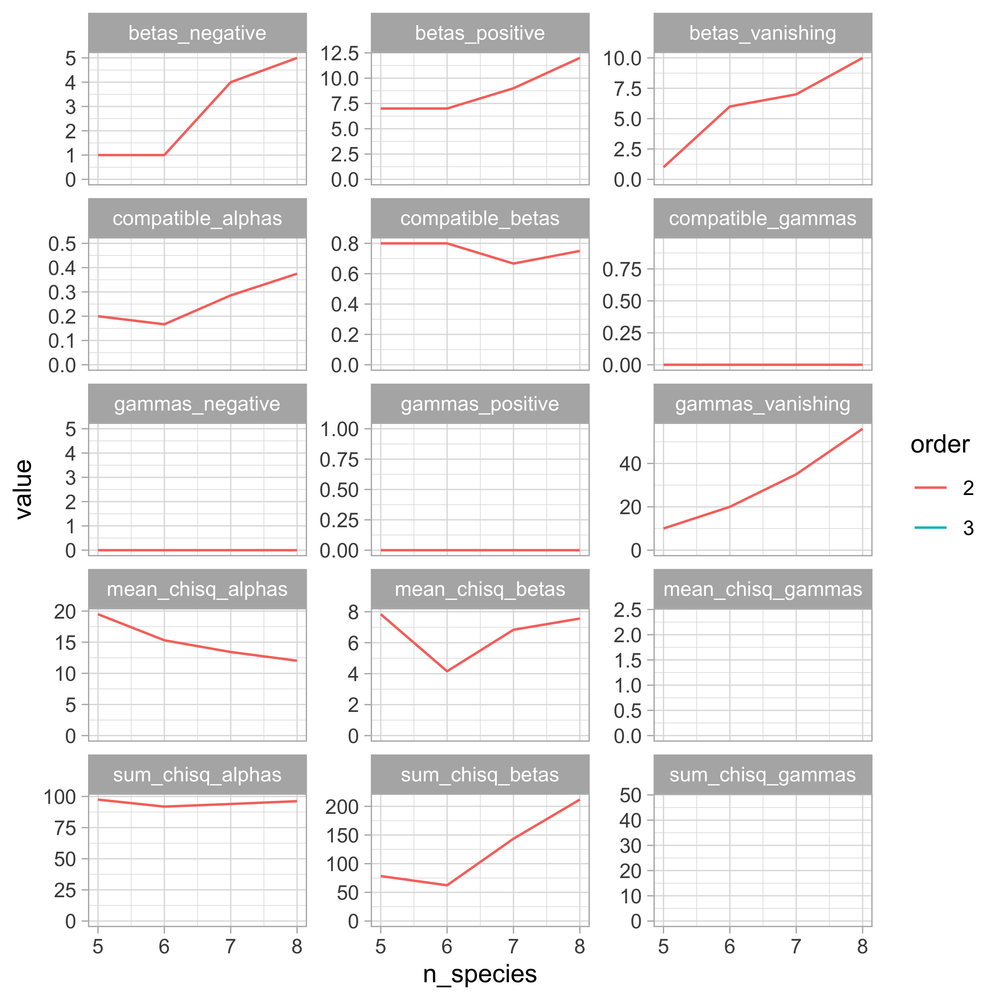

In [597]:
%%R -w 6 -h 6 -u in -r 600
stats %>%
    filter(n_species > 4) %>%
    filter(data_type != 'restoration') %>%
    ggplot(aes(y=value, x=n_species, color=order)) +#, linetype = data_type)) +
    facet_wrap(. ~ name, scales='free_y', ncol=3) +
    ylim(c(0,NA)) +
    geom_line()

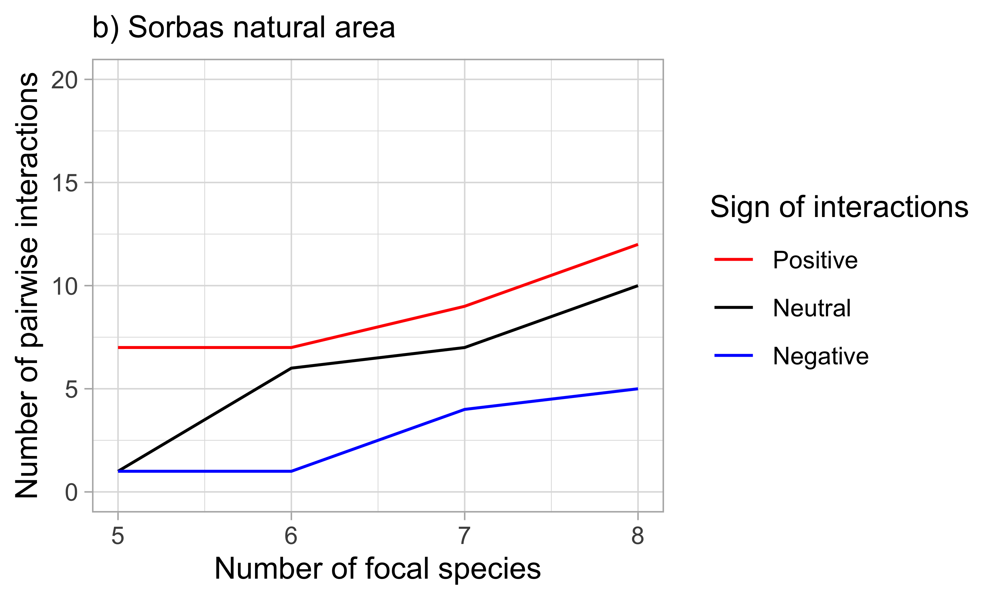

In [598]:
%%R -w 5 -h 3 -u in -r 600

p = stats %>%
    filter(n_species > 4) %>%
    filter(str_detect(name, "^betas_")) %>%
    # filter(order %in% chosen_fit_orders) %>%
    filter(order == chosen_order) %>%
    filter(data_type == 'natural') %>%
    mutate(name = factor(name, levels = c('betas_positive', 'betas_vanishing', 'betas_negative'),
                          labels = c('Positive', 'Neutral', 'Negative'))) %>%
    mutate(name = fct_reorder(name, desc(value), .fun='mean' )) %>%
    ggplot(aes(y=value, x=n_species, color=name)) +#, linetype=data_type
    scale_color_manual(values = c('Neutral'='black', 'Negative'='blue', 'Positive'="red")) +
    # facet_wrap(. ~ name, scales='free_y', ncol=3) +
#    scale_y_continuous(labels=scales::percent, limits=c(0,1)) +
    geom_line() +
    labs(#title = location, "-based restoration",
        subtitle = paste0(title, ' ', location_name, ' natural area'),
         # subtitle = location,
         x = 'Number of focal species',
        y = 'Number of pairwise interactions',
         color = 'Sign of interactions'
        ) +
        ylim(0,20)


ggsave(paste0(filename, 'fig_sign_betas_', location, '_', as.character(n_spp), '+',
              as.character(indicator), '_species.png'), w=5, h=3)

p


In [582]:
%%R
filename

[1] "outputs_Sorbas/8+1_species/Nurse_S._viscosa-Nurse_G._struthium-H._squamatum-S._viscosa-C._hispanica-G._struthium-S._sediforme-H._syriacum-Other_species/"


In [583]:
%%R
chosen_fit_orders = c(2,3)

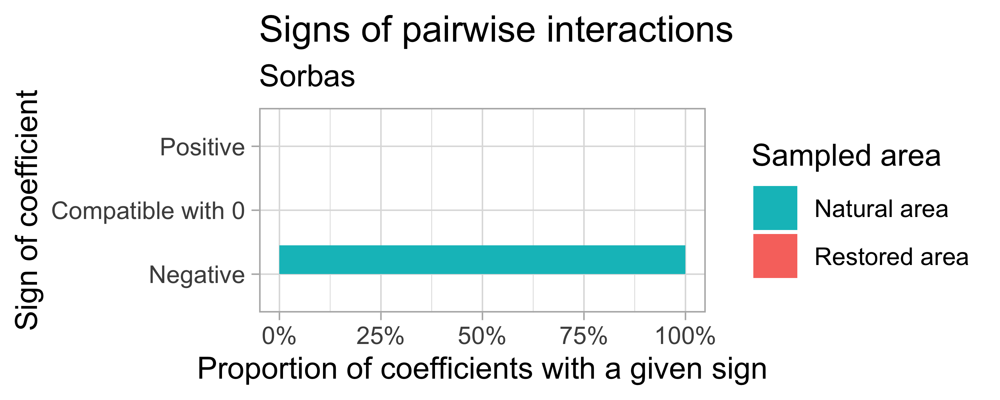

In [584]:
%%R -w 5 -h 2 -u in -r 600

n_spp = 6

p = stats %>%
    filter(n_species == n_spp) %>%
    filter(str_detect(name, "^betas_")) %>%
    filter(order %in% chosen_fit_orders) %>%
    filter(order == 3) %>%
    mutate(data_type = factor(data_type, levels = data_levels, labels = data_labels)) %>%
    mutate(name = factor(name, levels = c('betas_positive', 'betas_vanishing', 'betas_negative'),
                          labels = c('Positive', 'Compatible with 0', 'Negative'))) %>%
    ggplot(aes(y=name, x=value, fill=data_type)) +
    # scale_color_manual(values = c('Compatible with 0'='black', 'Negative'='blue', 'Positive'="red")) +
    # facet_wrap(. ~ name, scales='free_y', ncol=3) +
    scale_x_continuous(labels=scales::percent, limits=c(0,1)) +
    geom_col(position='dodge') +
    scale_y_discrete(limits=rev) +
    guides(fill = guide_legend(reverse=T)) +
    labs(title = 'Signs of pairwise interactions',
         subtitle = location,
         y = 'Sign of coefficient',
        x = 'Proportion of coefficients with a given sign',
         fill = 'Sampled area'
        )

# ggsave(paste0(filename, 'fig_sign_betas_bar_', location, '_', as.character(n_spp), '+', as.character(indicator), '_species.png'), w=5, h=2)

p


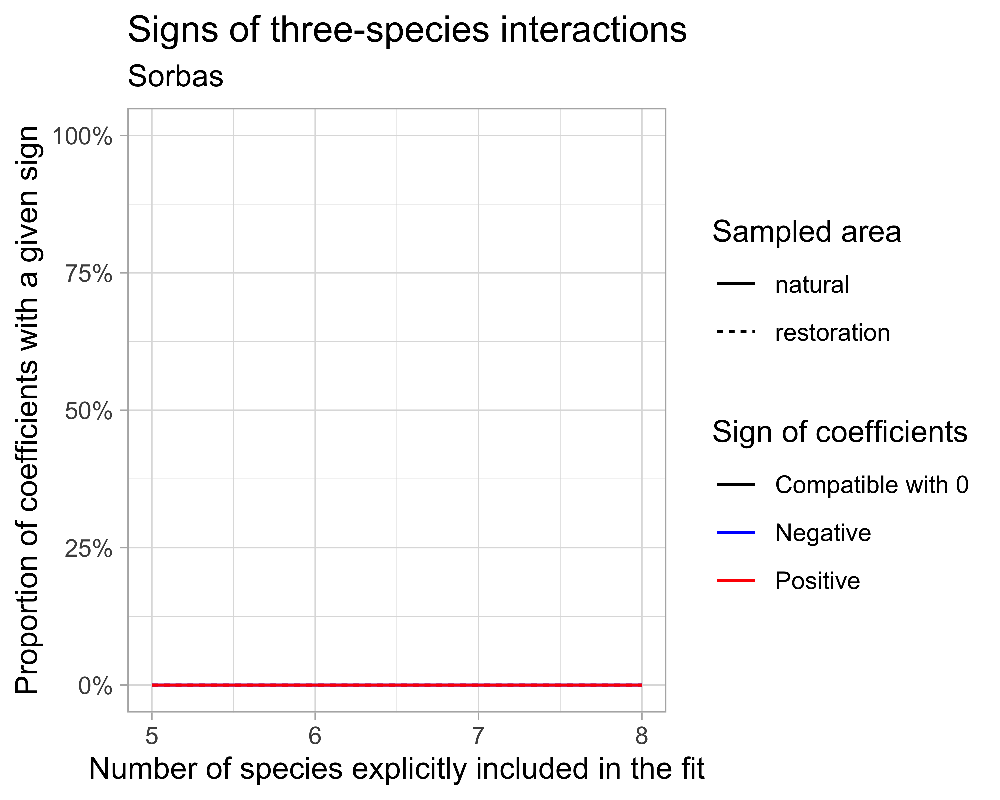

In [585]:
%%R -w 5 -h 4 -u in -r 600

p = stats %>%
    filter(str_detect(name, "^gammas_")) %>%
    filter(order %in% chosen_fit_orders) %>%
    filter(order == chosen_order) %>%
    # filter(data_type != 'restoration') %>%
    filter(n_species > 4) %>%
    mutate(name = factor(name, levels = c('gammas_vanishing', 'gammas_negative', 'gammas_positive'),
                          labels = c('Compatible with 0', 'Negative', 'Positive'))) %>%
    mutate(name = fct_reorder(name, desc(value), .fun='mean' )) %>%
    ggplot(aes(y=value, x=n_species, color=name, linetype = data_type)) +
    # facet_wrap(. ~ name, scales='free_y', ncol=3) +
    scale_y_continuous(labels=scales::percent, limits=c(0,1)) +
    scale_color_manual(values = c('Compatible with 0'='black', 'Negative'='blue', 'Positive'="red")) +
    geom_line() +
    labs(title = 'Signs of three-species interactions',
        subtitle = location,
         x = 'Number of species explicitly included in the fit',
        y = 'Proportion of coefficients with a given sign',
         color = 'Sign of coefficients',
         linetype = 'Sampled area'
        )

ggsave(paste0(filename, 'fig_sign_gammas_', location, '_', as.character(n_spp), '+',
              as.character(indicator), '_species.png'), w=5, h=4)

p


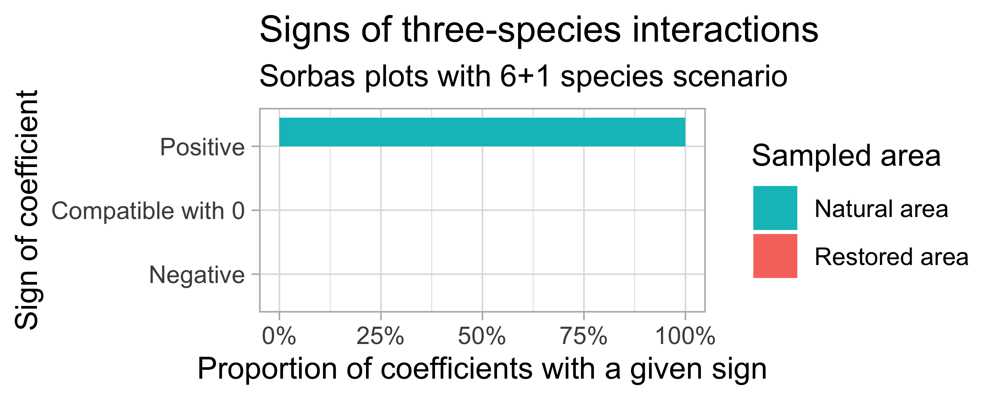

In [586]:
%%R -w 5 -h 2 -u in -r 600

p = stats %>%
    filter(n_species == n_spp) %>%
    filter(str_detect(name, "^gammas_")) %>%
    filter(order %in% chosen_fit_orders) %>%
    filter(order == 3) %>%
    mutate(data_type = factor(data_type, levels = data_levels, labels = data_labels)) %>%
    mutate(name = factor(name, levels = c('gammas_positive', 'gammas_vanishing', 'gammas_negative'),
                          labels = c('Positive', 'Compatible with 0', 'Negative'))) %>%
    ggplot(aes(y=name, x=value, fill=data_type)) +
    # scale_color_manual(values = c('Compatible with 0'='black', 'Negative'='blue', 'Positive'="red")) +
    # facet_wrap(. ~ name, scales='free_y', ncol=3) +
    scale_x_continuous(labels=scales::percent, limits=c(0,1)) +
    geom_col(position='dodge') +
    scale_y_discrete(limits=rev) +
    guides(fill = guide_legend(reverse=T)) +
    labs(title = 'Signs of three-species interactions',
         subtitle = paste0(location, ' plots with ', as.character(n_spp), '+', as.character(indicator), ' species scenario'),
         y = 'Sign of coefficient',
        x = 'Proportion of coefficients with a given sign',
         fill = 'Sampled area'
        )

ggsave(paste0(filename, 'fig_sign_gammas_bar_', location, '_', as.character(n_spp), '+',
              as.character(indicator), '_species.png'), w=5, h=2)

p


`geom_line()`: Each group consists of only one observation.
ℹ Do you need to adjust the group aesthetic?
`geom_line()`: Each group consists of only one observation.
ℹ Do you need to adjust the group aesthetic?


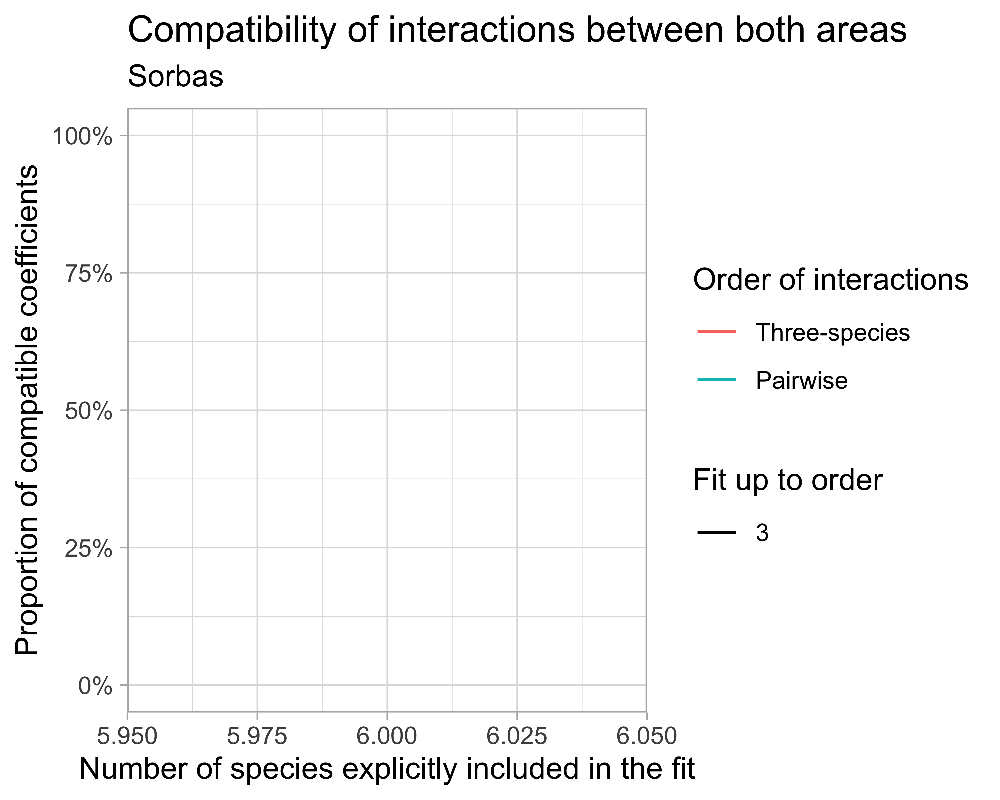

In [587]:
%%R -w 5 -h 4 -u in -r 600

p = stats %>%
    filter(str_detect(name, "^compatible_")) %>%
    filter(!str_detect(name, "^compatible_alphas")) %>%
    filter(order %in% chosen_fit_orders) %>%
    filter(order == 3) %>%
    filter(data_type == 'combined') %>%
    filter(n_species > 4) %>%
    mutate(name = factor(name, levels = c('compatible_betas', 'compatible_gammas'),
                          labels = c('Pairwise', 'Three-species'))) %>%
    mutate(name = fct_reorder(name, desc(value), .fun='max' )) %>%
    ggplot(aes(y=value, x=n_species, color=name, linetype = order)) +
    # facet_wrap(. ~ name, scales='free_y', ncol=3) +
    scale_y_continuous(labels=scales::percent, limits=c(0,1)) +
    geom_line() +
    # geom_hline(yintercept=0) +
    labs(title = 'Compatibility of interactions between both areas',
         subtitle = paste(location),
         x = 'Number of species explicitly included in the fit',
        y = 'Proportion of compatible coefficients',
         color = 'Order of interactions',
         linetype = 'Fit up to order'
        )

ggsave(paste0(filename, 'fig_compatibility_', location, '_', as.character(n_spp), '+',
              as.character(indicator), '_species.png'), w=5, h=4)

p


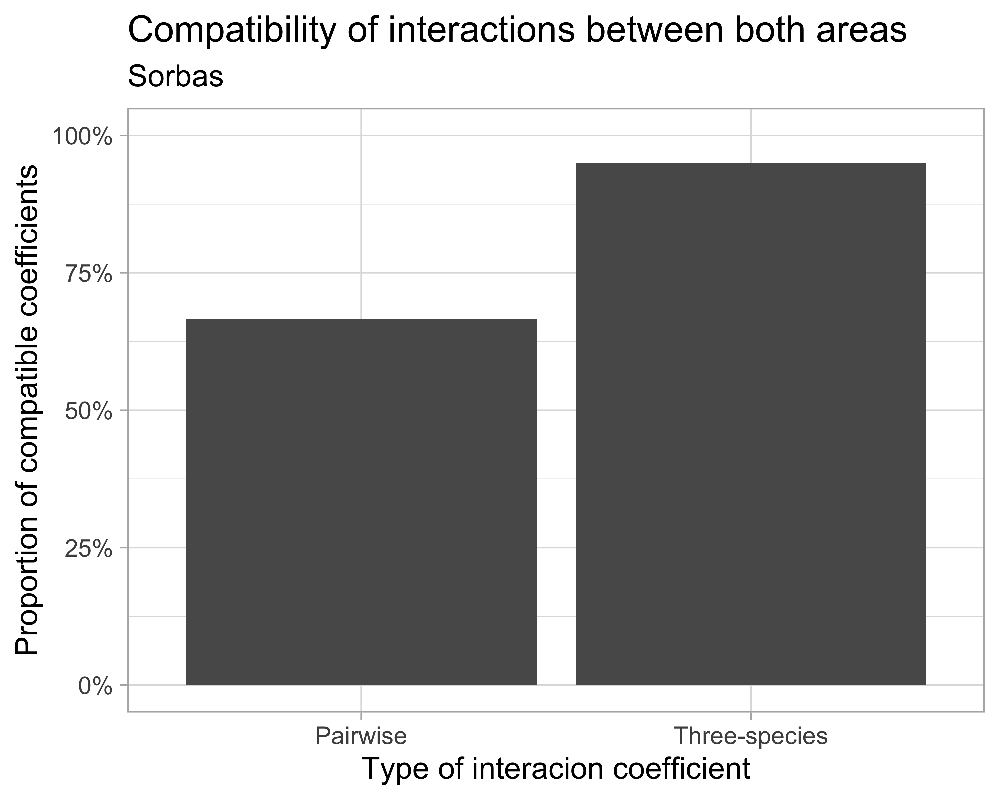

In [588]:
%%R -w 5 -h 4 -u in -r 600

p = stats %>%
    filter(str_detect(name, "^compatible_")) %>%
    filter(!str_detect(name, "^compatible_alphas")) %>%
    filter(order %in% chosen_fit_orders) %>%
    filter(order == 3) %>%
    filter(data_type == 'combined') %>%
    filter(n_species == n_spp) %>%
    mutate(name = factor(name, levels = c('compatible_betas', 'compatible_gammas'),
                          labels = c('Pairwise', 'Three-species'))) %>%
    # mutate(name = fct_reorder(name, desc(value), .fun='max' )) %>%
    ggplot(aes(y=value, x=name)) +#, linetype = order)) +
    # facet_wrap(. ~ name, scales='free_y', ncol=3) +
    scale_y_continuous(labels=scales::percent, limits=c(0,1)) +
    geom_col() +
    # geom_hline(yintercept=0) +
    labs(title = 'Compatibility of interactions between both areas',
         subtitle = paste(location),
         x = 'Type of interacion coefficient',
        y = 'Proportion of compatible coefficients',
         color = 'Order of interactions',
         linetype = 'Fit up to order'
        )

ggsave(paste0(filename, 'fig_compatibility_bar_', location, '_', as.character(n_spp), '+',
              as.character(indicator), '_species.png'), w=5, h=4)

p


`geom_line()`: Each group consists of only one observation.
ℹ Do you need to adjust the group aesthetic?
`geom_line()`: Each group consists of only one observation.
ℹ Do you need to adjust the group aesthetic?


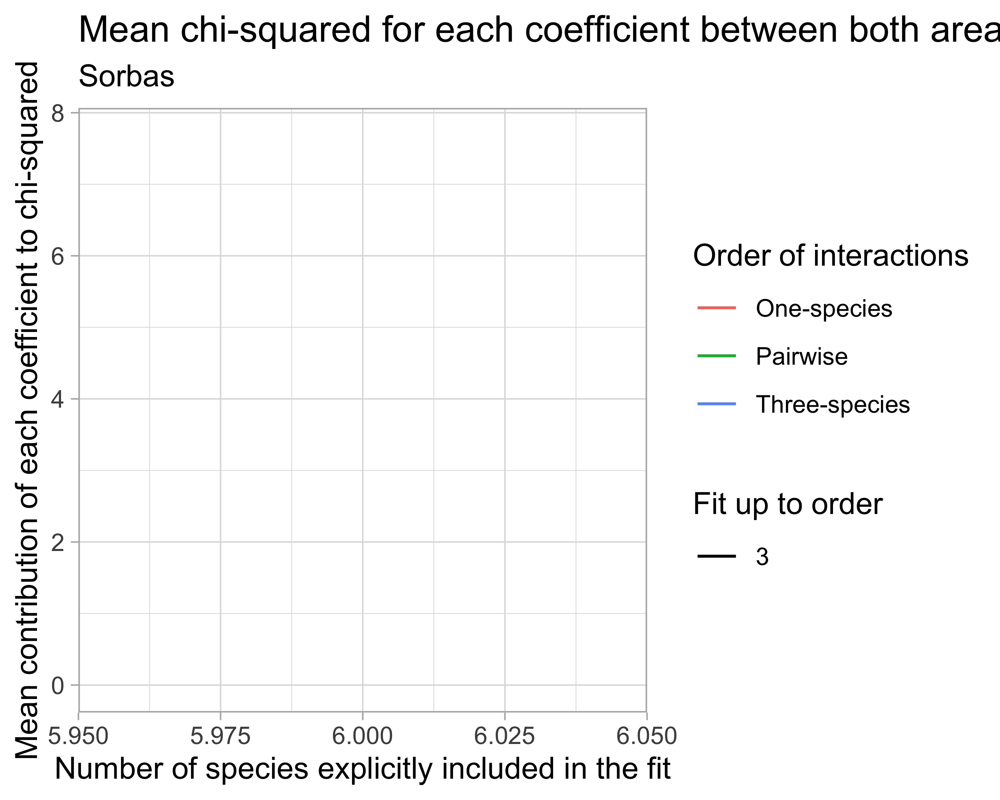

In [589]:
%%R -w 5 -h 4 -u in -r 600

p = stats %>%
    filter(str_detect(name, "^mean_chisq_")) %>%
    filter(order %in% chosen_fit_orders) %>%
    filter(order == 3) %>%
    # filter(data_type == 'combined') %>%
    filter(n_species > 4) %>%
    mutate(name = factor(name, levels = c('mean_chisq_alphas', 'mean_chisq_betas', 'mean_chisq_gammas'),
                          labels = c('One-species', 'Pairwise', 'Three-species'))) %>%
    mutate(name = fct_reorder(name, desc(value), .fun='max' )) %>%
    ggplot(aes(y=value, x=n_species, color=name, linetype=order)) +
    ylim(c(0,NA)) +
    # facet_wrap(. ~ name, scales='free_y', ncol=3) +
    geom_line() +
    # geom_hline(yintercept=0) +
    labs(title = 'Mean chi-squared for each coefficient between both areas',
         subtitle = paste(location),
         x = 'Number of species explicitly included in the fit',
        y = 'Mean contribution of each coefficient to chi-squared',
         color = 'Order of interactions',
         linetype = 'Fit up to order'
        )

ggsave(paste0(filename, 'fig_chisq_mean_', location, '_', as.character(n_spp), '+',
              as.character(indicator), '_species.png'), w=5, h=4)

p


`geom_line()`: Each group consists of only one observation.
ℹ Do you need to adjust the group aesthetic?
`geom_line()`: Each group consists of only one observation.
ℹ Do you need to adjust the group aesthetic?


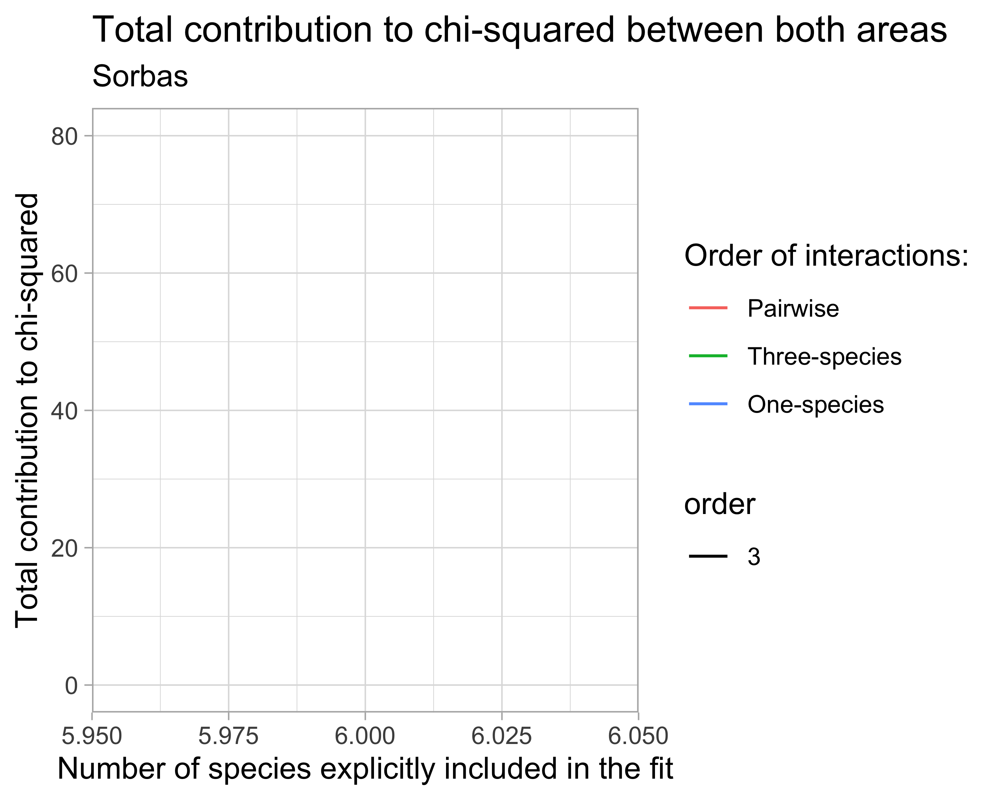

In [590]:
%%R -w 5 -h 4 -u in -r 600

p = stats %>%
    filter(str_detect(name, "^sum_chisq_")) %>%
    filter(order %in% chosen_fit_orders) %>%
    filter(data_type == 'combined') %>%
    filter(order == 3) %>%
    filter(n_species > 4) %>%
    mutate(name = factor(name, levels = c('sum_chisq_alphas', 'sum_chisq_betas', 'sum_chisq_gammas'),
                          labels = c('One-species', 'Pairwise', 'Three-species'))) %>%
    mutate(name = fct_reorder(name, desc(value), .fun='max' )) %>%
    ggplot(aes(y=value, x=n_species, color=name, linetype = order)) +
    ylim(c(0,NA)) +
    # facet_wrap(. ~ name, scales='free_y', ncol=3) +
    geom_line() +
    # geom_hline(yintercept=0) +
    labs(title = 'Total contribution to chi-squared between both areas',
         subtitle = paste(location),
         x = 'Number of species explicitly included in the fit',
        y = 'Total contribution to chi-squared',
         color = 'Order of interactions:'
        )

ggsave(paste0(filename, 'fig_chisq_sum_', location, '_', as.character(n_spp), '+',
              as.character(indicator), '_species.png'), w=5, h=4)

p


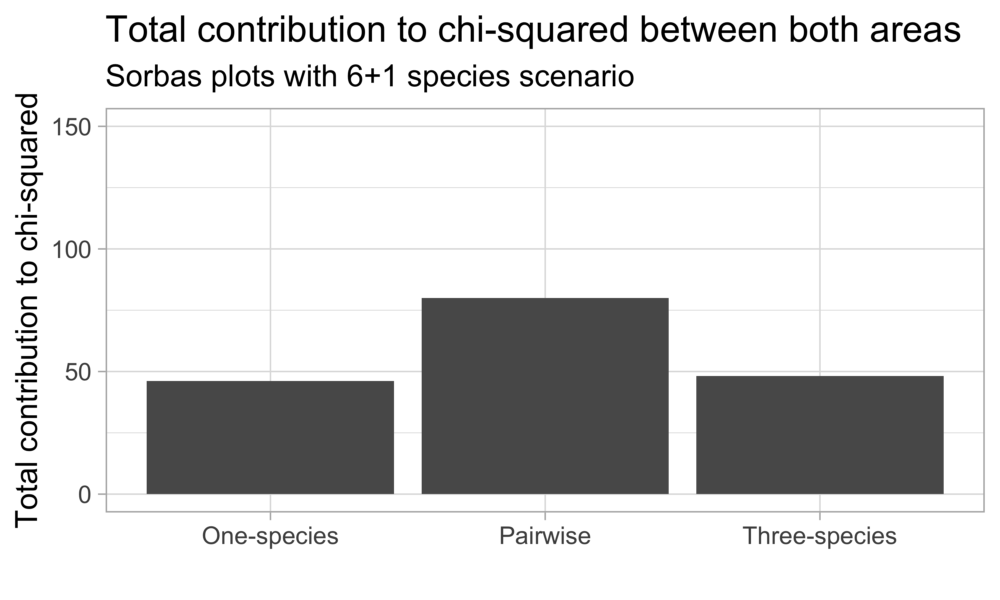

In [591]:
%%R -w 5 -h 3 -u in -r 600

n_spp = 6

p = stats %>%
    filter(str_detect(name, "^sum_chisq_")) %>%
    filter(order %in% chosen_fit_orders) %>%
    filter(data_type == 'combined') %>%
    filter(order == 3) %>%
    filter(n_species == n_spp) %>%
    mutate(name = factor(name, levels = c('sum_chisq_alphas', 'sum_chisq_betas', 'sum_chisq_gammas'),
                          labels = c('One-species', 'Pairwise', 'Three-species'))) %>%
    # mutate(name = fct_reorder(name, desc(value), .fun='max' )) %>%
    ggplot(aes(y=value, x=name)) +
    ylim(c(0, 150)) +
    # facet_wrap(. ~ name, scales='free_y', ncol=3) +
    geom_col() +
    # geom_hline(yintercept=0) +
    labs(title = 'Total contribution to chi-squared between both areas',
         subtitle = paste0(location, ' plots with ', as.character(n_spp), '+', as.character(indicator), ' species scenario'),
         x = '',
        y = 'Total contribution to chi-squared',
         color = 'Order of interactions:'
        )

ggsave(paste0(filename, 'fig_chisq_bar_sum_', location, '_', as.character(n_spp), '+',
              as.character(indicator), '_species.png'), w=5, h=3)

p


`geom_line()`: Each group consists of only one observation.
ℹ Do you need to adjust the group aesthetic?


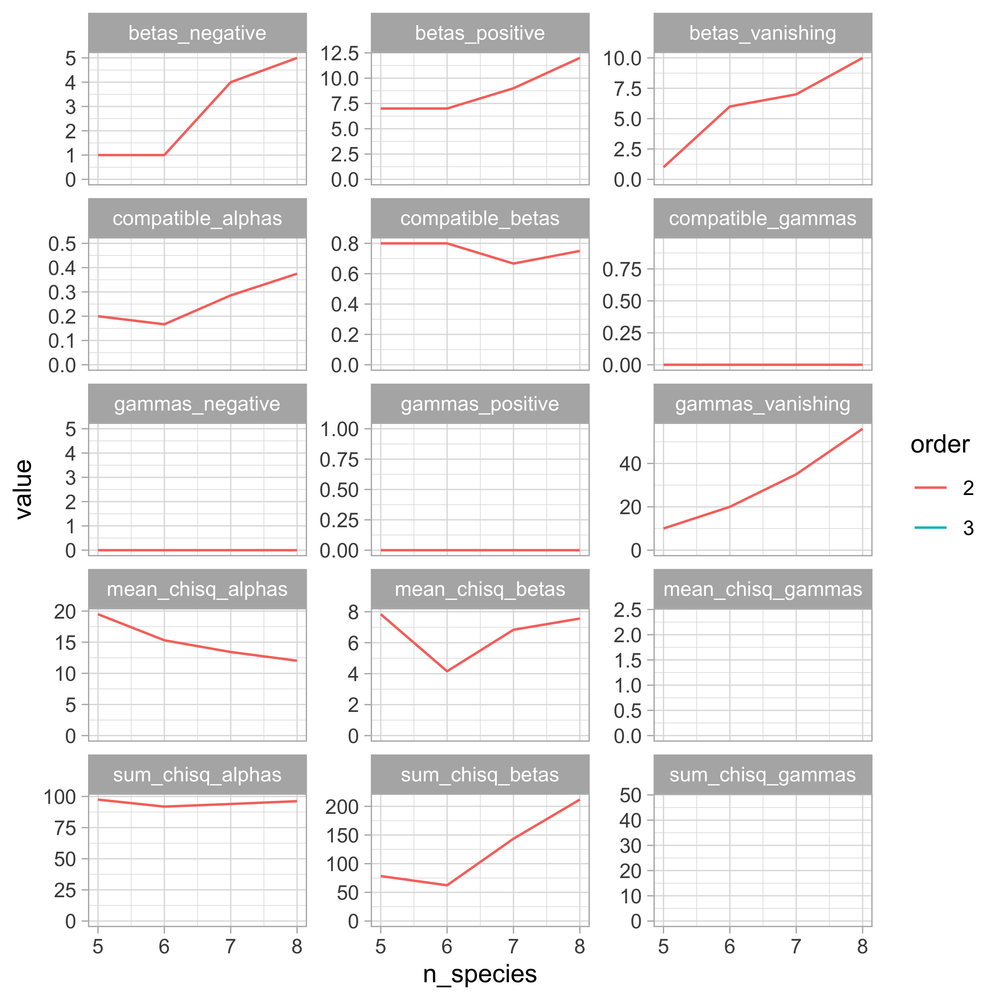

In [592]:
%%R -w 6 -h 6 -u in -r 600
stats %>%
    # filter(n_species > 5) %>%
    filter(data_type != 'restoration') %>%
    ggplot(aes(y=value, x=n_species, color=order)) +#, linetype = data_type)) +
    facet_wrap(. ~ name, scales='free_y', ncol=3) +
    ylim(c(0,NA)) +
    geom_line()

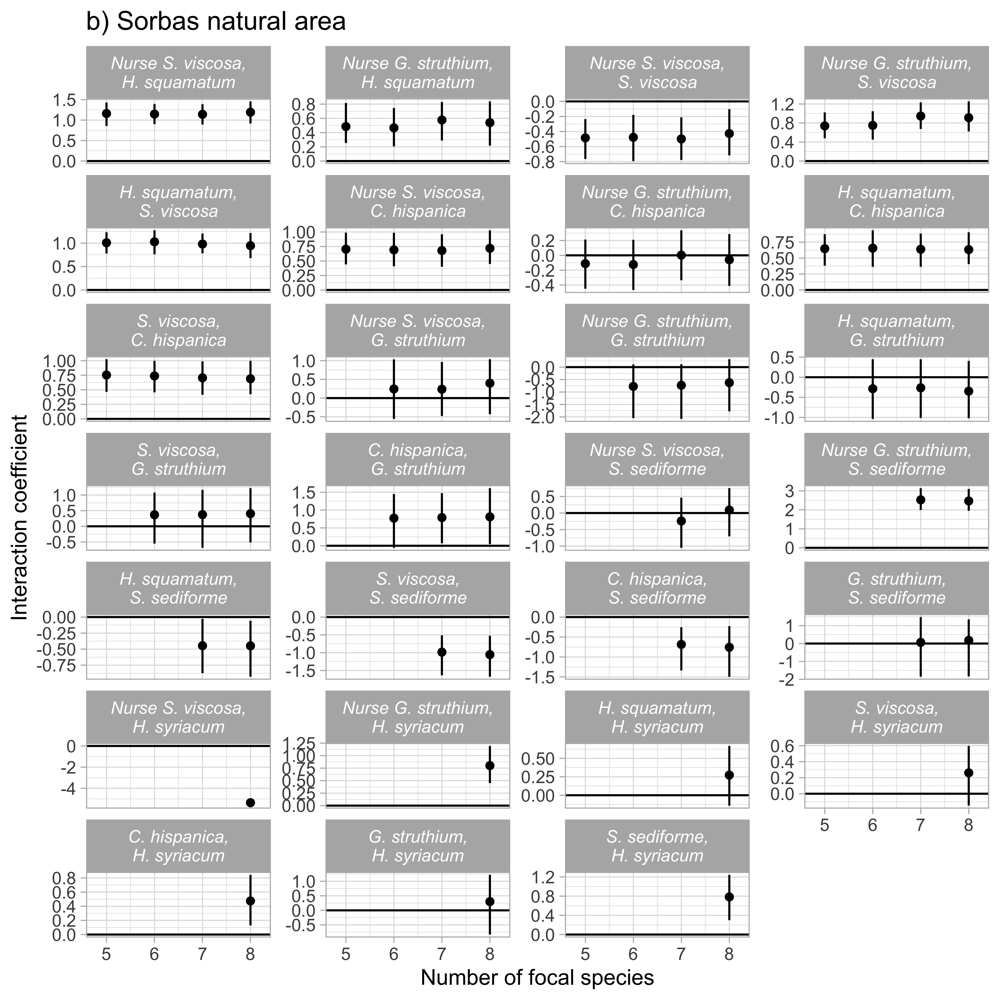

In [599]:
%%R -w 7 -h 7 -r 600 -u in

substitute = function(string){
    gsub(', ', ',\n', gsub("U. sp", 'U. parviflorus', gsub("_", " ", gsub(", _", ". ", gsub(".", ", ", string, fixed=TRUE), fixed=TRUE), fixed=TRUE), fixed=TRUE))
}
  
q = all_t2 %>%
    filter(data_type == 'natural') %>%
    filter(!str_detect(Var2, "^Nurse")) %>%
    filter(order == 2) %>%
    filter(n_species > 4) %>%
    mutate(quad = interaction(Var1, Var2))
    
quad_levels = q %>% pluck('quad') %>% levels()
quad_labels = quad_levels %>% substitute() 

p2 = q %>%
    filter(!str_detect(Var2, "^Nurse")) %>%
    mutate(quad=factor(quad, levels=quad_levels, labels=quad_labels)) %>%
    ggplot(aes(x=n_species)) +
    facet_wrap(quad ~ ., scales='free_y', ncol=4) +
    geom_linerange(aes(ymin = bottom, ymax=top), position = position_dodge2(width = 0.5)) +
    geom_hline(yintercept = 0) +
    geom_point(aes(y=median), position = position_dodge2(width = 0.5)) +
    labs(title = paste(title, location_name, 'natural area'),
         x = 'Number of focal species',
        y = 'Interaction coefficient'
        ) +
    theme(strip.text=element_text(face="italic"))

ggsave(paste0(filename, 'fig_n_spp_', location, '_', as.character(n_spp), '+',
              as.character(indicator), '_species.png'), w=7, h=7)

p2

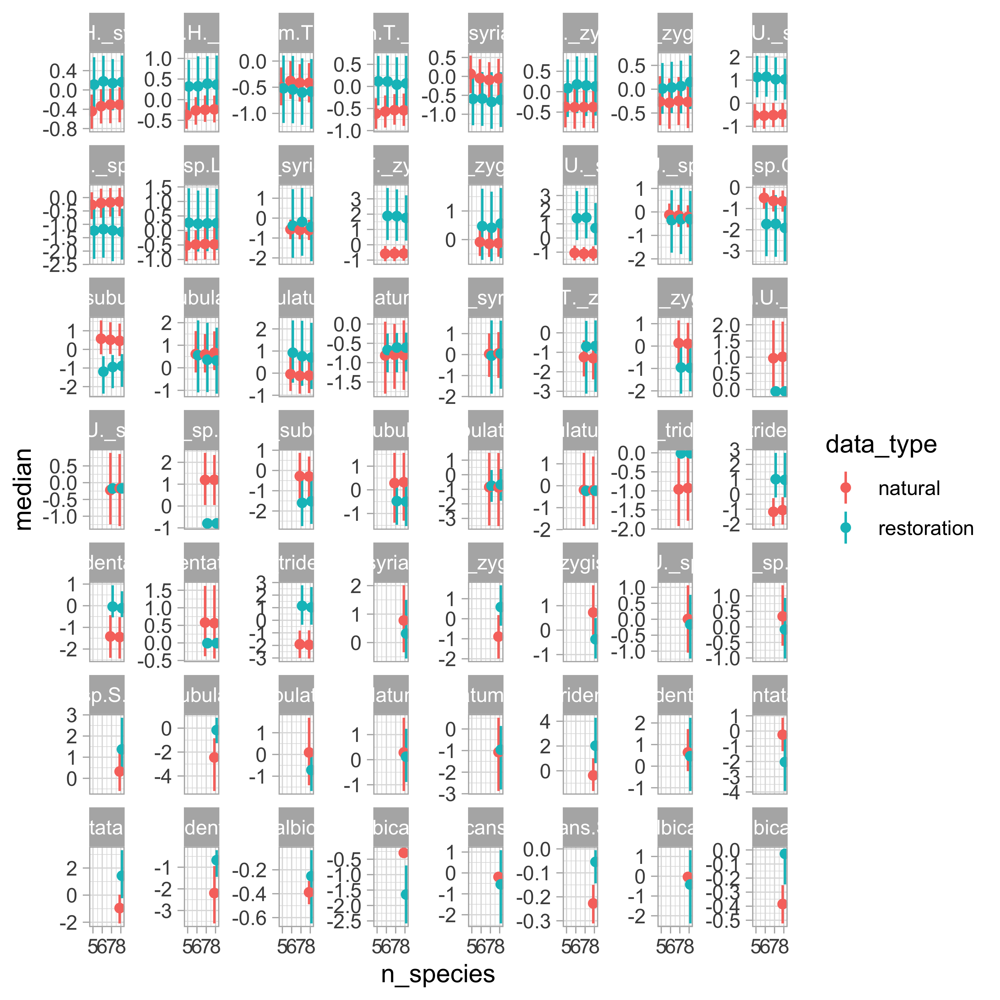

In [89]:
%%R -w 6 -h 6 -r 600 -u in    
    
p3 = all_t3 %>%
    # filter(data_type == 'natural') %>%
    # filter(str_detect(data_type, "^Natural area")) %>%
    filter(order == 3) %>%
    ggplot(aes(x=n_species,
               color=data_type,
              # linetype = order
              )
          ) +
    facet_wrap(interaction(Var1, Var2, Var3)~., scales='free_y') +
    geom_linerange(aes(ymin = bottom, ymax=top), position = position_dodge2(width = 0.5)) +
    geom_point(aes(y=median), position = position_dodge2(width = 0.5))


p3